#### This Notebool Implements ROC-AUC on all data points and no feature selection

In [1]:
import pandas as pd
import os
from tqdm import tqdm
import seaborn as sns
import mne
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import FastICA
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from scipy.stats import pearsonr
from sklearn.neighbors import NearestCentroid as NCC

In [2]:
def filter(data): # Pass sampling rate as an argument
    # median filter to remove artifacts
    # data = signal.medfilt(data, kernel_size=3) # Uncomment if needed

    # --- High-Pass Filter ---
    hpf_cutoff = 1  # Hz - Recommended for ERPs to remove slow drift
    hpf_order = 4     # Filter order (can be same or different from LPF)

    # Design Butterworth HPF
    # Note: fs/2 is the Nyquist frequency
    b_high, a_high = signal.butter(hpf_order, hpf_cutoff / 100, btype='high')

    # Apply HPF using zero-phase filtering
    # Apply along the time axis (assuming channels x time or trials x channels x time)
    data_hpf = signal.filtfilt(b_high, a_high, data, axis=-1)

    # --- Low-Pass Filter ---
    lpf_cutoff = 40.0  # Hz - Typical for ERPs
    lpf_order = 4      # Filter order

    # Design Butterworth LPF
    b_low, a_low = signal.butter(lpf_order, lpf_cutoff / 100, btype='low')

    # Apply LPF using zero-phase filtering to the high-passed data
    filtered_data = signal.filtfilt(b_low, a_low, data_hpf, axis=-1)

    return filtered_data

In [4]:
eeg_channels = ['Fp1', 'Fp2', 'AF7', 'AF3', 'AF4', 'AF8', 'F7', 'F5', 'F3',
    'F1', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT7', 'FC5', 'FC3', 'FC1', 'FCz',
    'FC2', 'FC4', 'FC6', 'FT8', 'T7', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4',
    'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6',
    'TP8', 'P7', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'P8', 'PO7',
    'POz', 'P08', 'O1', 'O2']

eog_channel = 'EOG' 

all_channels = eeg_channels + [eog_channel]
all_labels = pd.read_csv('TrainLabels.csv').Prediction.values

In [5]:
try:
    all_epochs = np.load('all_epochs.npy')
except:
    all_epochs = [] # Store cleaned EEG epochs

    # --- Loop through sessions ---
    for filename in tqdm(os.listdir('train')):
        session_data = pd.read_csv(os.path.join('train', filename))

        # --- 1. Filter EEG and EOG Channels ---
        print(f"\nProcessing {filename}...")
        for id in all_channels:
            session_data[id] = filter(session_data[id].values)

        # --- 2. Prepare Continuous Data for ICA ---
        # Shape: (n_channels, n_timepoints)
        eeg_data = session_data[eeg_channels].values.T
        eog_data = session_data[eog_channel].values.reshape(1, -1) # Keep as 2D array

        # Transpose for sklearn: (n_timepoints, n_features)
        eeg_data_skl = eeg_data.T
        eog_data_skl = eog_data.T

        # --- 3. Standardize Data ---
        scaler_eeg = StandardScaler()
        eeg_data_scaled = scaler_eeg.fit_transform(eeg_data_skl)

        scaler_eog = StandardScaler()
        eog_data_scaled = scaler_eog.fit_transform(eog_data_skl) # Scale EOG separately

        # --- 4. Fit ICA on EEG Data ---
        n_components_ica = len(eeg_channels) # Use number of EEG channels as components
        ica = FastICA(n_components=n_components_ica,
                        random_state=42,
                        whiten='unit-variance', # Recommended for FastICA
                        max_iter=1000, # Increase iterations if convergence is an issue
                        tol=0.001)     # Convergence tolerance

        print("Fitting ICA...")
        sources_eeg = ica.fit_transform(eeg_data_scaled) # Shape: (n_timepoints, n_components_ica)
        print("ICA fitting complete.")

        # --- 5. Identify EOG Component(s) via Correlation ---
        print("Identifying EOG components...")
        correlations = []
        eog_signal_flat = eog_data_scaled.flatten() # Ensure EOG is 1D for correlation

        for i in range(sources_eeg.shape[1]):
            component_signal = sources_eeg[:, i]
            # Calculate Pearson correlation coefficient and p-value
            corr, _ = pearsonr(eog_signal_flat, component_signal)
            correlations.append(abs(corr)) # Use absolute correlation

            eog_component_index = np.argmax(correlations)
            max_corr = correlations[eog_component_index]

            print(f"Removing component {eog_component_index} with correlation: {max_corr:.4f}")
            sources_cleaned = sources_eeg.copy()
            sources_cleaned[:, eog_component_index] = 0

        # --- 7. Reconstruct Cleaned EEG Data ---
        print("Reconstructing cleaned EEG data...")
        # Use inverse_transform to go from sources back to sensor space
        eeg_data_cleaned_scaled = ica.inverse_transform(sources_cleaned)

        # --- 8. Un-standardize Cleaned EEG Data ---
        eeg_data_cleaned_unscaled = scaler_eeg.inverse_transform(eeg_data_cleaned_scaled)

        # Prepare cleaned data for epoching (back to DataFrame structure)
        eeg_data_to_epoch = pd.DataFrame(eeg_data_cleaned_unscaled, columns=eeg_channels, index=session_data.index)
        print("EEG data cleaned.")


        # --- 9. Epoching
        session_feedback_ids = session_data[session_data['FeedBackEvent'] == 1].index
        session_epochs = []
        print(f"Epoching {len(session_feedback_ids)} events...")
        for idx in session_feedback_ids:
            # Define epoch window relative to event index
            start_idx = idx - 40  # 200ms before (40 samples at 200Hz)
            end_idx = idx + 199 # 1000ms after (200 samples at 200Hz) -> inclusive index for .loc

            # Define baseline window relative to event index
            baseline_start_idx = idx - 40 # 200ms before
            baseline_end_idx = idx      # Up to (but not including) the event

            # Extract epoch data for EEG channels
            epoch_data = eeg_data_to_epoch.loc[start_idx:end_idx].copy()

            # Calculate baseline using the correct window from the *epoched* data
            baseline_data = epoch_data.loc[baseline_start_idx:baseline_end_idx]
            baseline_mean = baseline_data.mean(axis=0)

            # Apply baseline correction
            epoch_data -= baseline_mean

            # Append the baseline-corrected epoch (EEG channels only)
            session_epochs.append(epoch_data.values) # Append numpy array

        all_epochs.extend(session_epochs) # Add the cleaned epochs to the list
        print(f"Finished {filename}. Total epochs collected: {len(all_epochs)}")


    # --- Convert cleaned epochs to NumPy array ---
    # Shape: (n_epochs, n_timepoints_in_epoch, n_eeg_channels)
all_epochs = np.array(all_epochs)
print(f"Final shape of cleaned epochs array: {all_epochs.shape}")

Final shape of cleaned epochs array: (5440, 240, 56)


#### Roc-Auc for all data points

In [6]:
channel_to_roc = {}

for id, channel in tqdm(enumerate(eeg_channels)):
    # Get the data for the current channel (all epochs, all time points for the current channel)
    channel_data = [epoch[:, id] for epoch in all_epochs]
    channel_data = np.array(channel_data)  # Shape: (n_epochs, n_timepoints)
    
    print(f"Channel {channel} - channel_data shape: {channel_data.shape}")
    
    rocs = []
    
    # Loop over each time point (no averaging, calculate AUC for each time point)
    for time_point in range(channel_data.shape[1]):  # Looping over time points directly
        time_point_data = channel_data[:, time_point]  # Get the data for the current time point
        try:
            roc = roc_auc_score(all_labels, time_point_data)  # Calculate AUC for this time point
            rocs.append(roc)
        except ValueError as e:
            print(f"Error at time_point {time_point} for channel {channel}: {e}")
    
    # Store the ROC-AUC scores for this channel
    channel_to_roc[channel] = rocs


0it [00:00, ?it/s]

Channel Fp1 - channel_data shape: (5440, 240)


1it [00:00,  1.17it/s]

Channel Fp2 - channel_data shape: (5440, 240)


2it [00:01,  1.40it/s]

Channel AF7 - channel_data shape: (5440, 240)


3it [00:01,  1.65it/s]

Channel AF3 - channel_data shape: (5440, 240)


4it [00:02,  1.71it/s]

Channel AF4 - channel_data shape: (5440, 240)


5it [00:03,  1.78it/s]

Channel AF8 - channel_data shape: (5440, 240)


6it [00:03,  1.80it/s]

Channel F7 - channel_data shape: (5440, 240)


7it [00:04,  1.89it/s]

Channel F5 - channel_data shape: (5440, 240)


8it [00:04,  1.97it/s]

Channel F3 - channel_data shape: (5440, 240)


9it [00:04,  1.98it/s]

Channel F1 - channel_data shape: (5440, 240)


10it [00:05,  1.88it/s]

Channel Fz - channel_data shape: (5440, 240)


11it [00:06,  1.87it/s]

Channel F2 - channel_data shape: (5440, 240)


12it [00:06,  1.89it/s]

Channel F4 - channel_data shape: (5440, 240)


13it [00:07,  1.99it/s]

Channel F6 - channel_data shape: (5440, 240)


14it [00:07,  2.00it/s]

Channel F8 - channel_data shape: (5440, 240)


15it [00:07,  2.18it/s]

Channel FT7 - channel_data shape: (5440, 240)


16it [00:08,  2.30it/s]

Channel FC5 - channel_data shape: (5440, 240)


17it [00:08,  2.42it/s]

Channel FC3 - channel_data shape: (5440, 240)


18it [00:09,  2.51it/s]

Channel FC1 - channel_data shape: (5440, 240)


19it [00:09,  2.58it/s]

Channel FCz - channel_data shape: (5440, 240)


20it [00:09,  2.52it/s]

Channel FC2 - channel_data shape: (5440, 240)


21it [00:10,  2.59it/s]

Channel FC4 - channel_data shape: (5440, 240)


22it [00:10,  2.64it/s]

Channel FC6 - channel_data shape: (5440, 240)


23it [00:10,  2.56it/s]

Channel FT8 - channel_data shape: (5440, 240)


24it [00:11,  2.47it/s]

Channel T7 - channel_data shape: (5440, 240)


25it [00:11,  2.33it/s]

Channel C5 - channel_data shape: (5440, 240)


26it [00:28,  5.32s/it]

Channel C3 - channel_data shape: (5440, 240)
Channel C1 - channel_data shape: (5440, 240)
Channel Cz - channel_data shape: (5440, 240)
Channel C2 - channel_data shape: (5440, 240)
Channel C4 - channel_data shape: (5440, 240)
Channel C6 - channel_data shape: (5440, 240)
Channel T8 - channel_data shape: (5440, 240)
Channel TP7 - channel_data shape: (5440, 240)
Channel CP5 - channel_data shape: (5440, 240)
Channel CP3 - channel_data shape: (5440, 240)
Channel CP1 - channel_data shape: (5440, 240)
Channel CPz - channel_data shape: (5440, 240)
Channel CP2 - channel_data shape: (5440, 240)


39it [00:33,  1.14s/it]

Channel CP4 - channel_data shape: (5440, 240)
Channel CP6 - channel_data shape: (5440, 240)
Channel TP8 - channel_data shape: (5440, 240)
Channel P7 - channel_data shape: (5440, 240)
Channel P5 - channel_data shape: (5440, 240)
Channel P3 - channel_data shape: (5440, 240)
Channel P1 - channel_data shape: (5440, 240)
Channel Pz - channel_data shape: (5440, 240)
Channel P2 - channel_data shape: (5440, 240)
Channel P4 - channel_data shape: (5440, 240)
Channel P6 - channel_data shape: (5440, 240)
Channel P8 - channel_data shape: (5440, 240)
Channel PO7 - channel_data shape: (5440, 240)
Channel POz - channel_data shape: (5440, 240)
Channel P08 - channel_data shape: (5440, 240)
Channel O1 - channel_data shape: (5440, 240)
Channel O2 - channel_data shape: (5440, 240)


56it [00:24,  2.32it/s]


In [16]:
time_labels

array([-200, -100,    0,  100,  200,  300,  400,  500,  600,  700,  800,
        900, 1000])

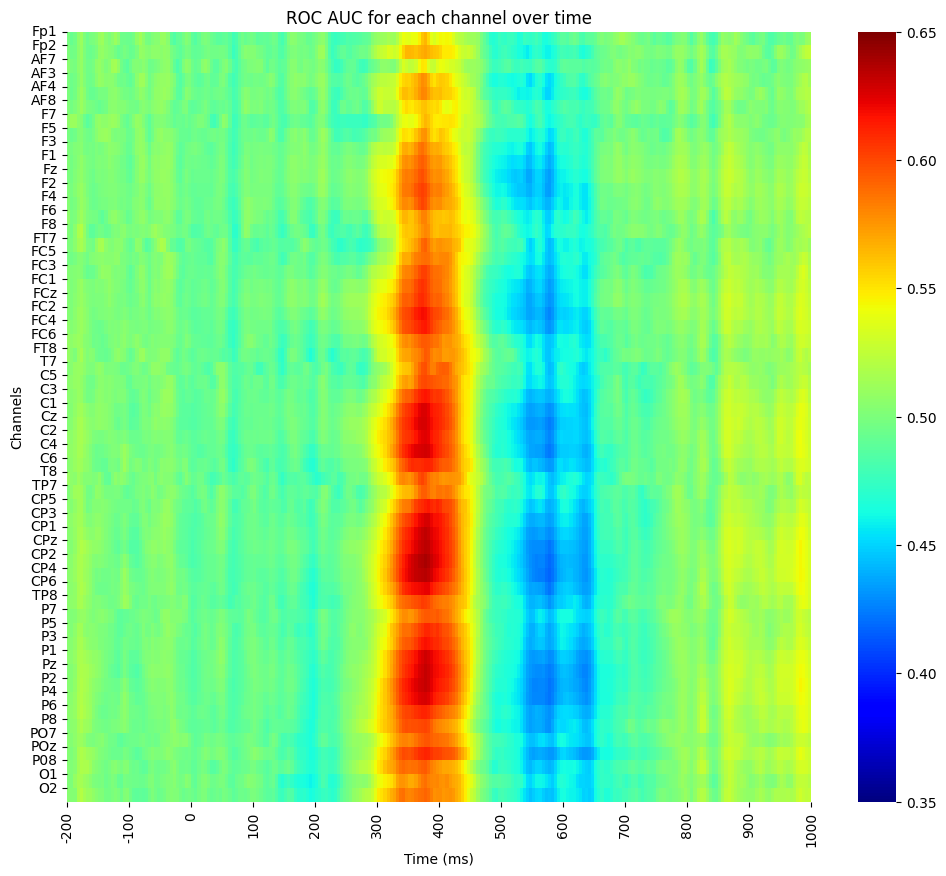

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Create a NumPy array from channel_to_roc
arr = np.array([channel_to_roc[channel] for channel in eeg_channels])

# Number of timepoints in your data
n_timepoints = arr.shape[1]  # This should correspond to the number of time points in the data

# Generate time labels from -200 ms to 1000 ms
time_labels = np.arange(-200, 1100, 100)  # Linearly spaced time labels

# Plotting
plt.figure(figsize=(12, 10))
sns.heatmap(arr, cmap='jet', vmin=0.35, vmax=0.65)  # Adjust the color scale as needed

# Adjust xticks to show every 4th timepoint (for clarity)
plt.xticks(np.arange(0, 260, 20), time_labels, rotation=90)  # Adjust time labels
plt.yticks(np.arange(0, len(eeg_channels)), eeg_channels, rotation=0)
plt.xlabel('Time (ms)')
plt.ylabel('Channels')
plt.title('ROC AUC for each channel over time')
plt.show()


In [27]:
n_timepoints

240

In [32]:
np.arange(-200, 1005, 5)

array([-200, -195, -190, -185, -180, -175, -170, -165, -160, -155, -150,
       -145, -140, -135, -130, -125, -120, -115, -110, -105, -100,  -95,
        -90,  -85,  -80,  -75,  -70,  -65,  -60,  -55,  -50,  -45,  -40,
        -35,  -30,  -25,  -20,  -15,  -10,   -5,    0,    5,   10,   15,
         20,   25,   30,   35,   40,   45,   50,   55,   60,   65,   70,
         75,   80,   85,   90,   95,  100,  105,  110,  115,  120,  125,
        130,  135,  140,  145,  150,  155,  160,  165,  170,  175,  180,
        185,  190,  195,  200,  205,  210,  215,  220,  225,  230,  235,
        240,  245,  250,  255,  260,  265,  270,  275,  280,  285,  290,
        295,  300,  305,  310,  315,  320,  325,  330,  335,  340,  345,
        350,  355,  360,  365,  370,  375,  380,  385,  390,  395,  400,
        405,  410,  415,  420,  425,  430,  435,  440,  445,  450,  455,
        460,  465,  470,  475,  480,  485,  490,  495,  500,  505,  510,
        515,  520,  525,  530,  535,  540,  545,  5

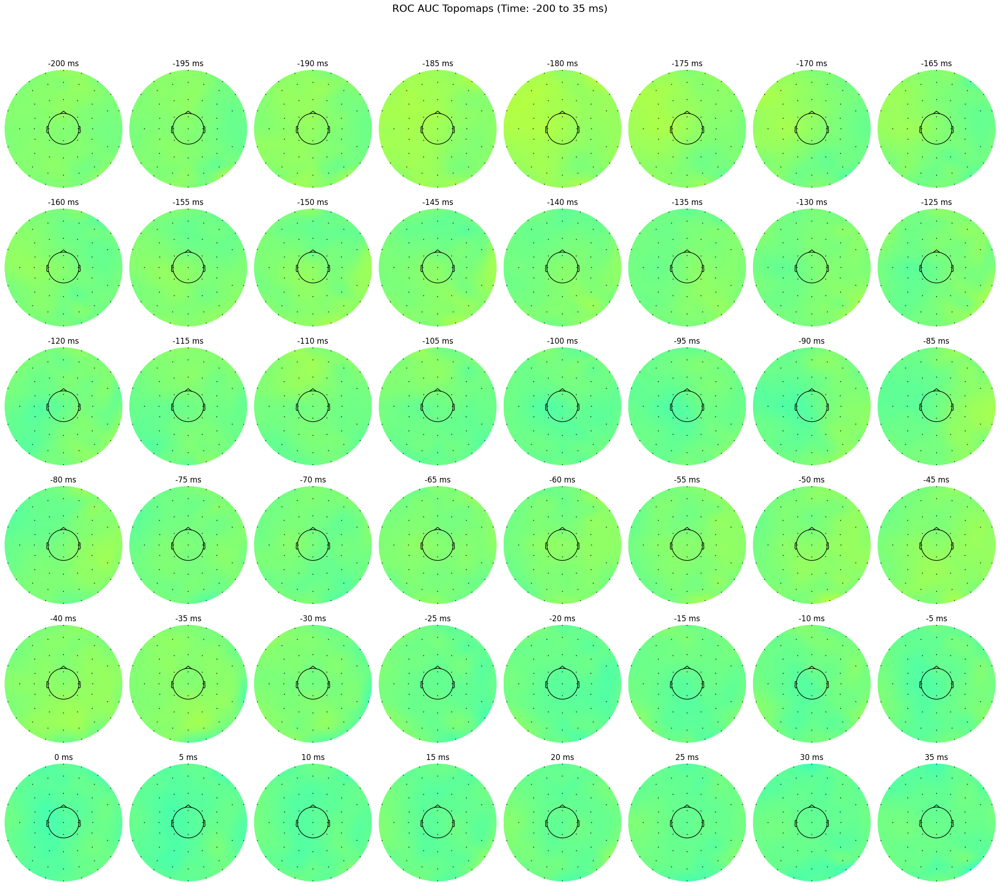

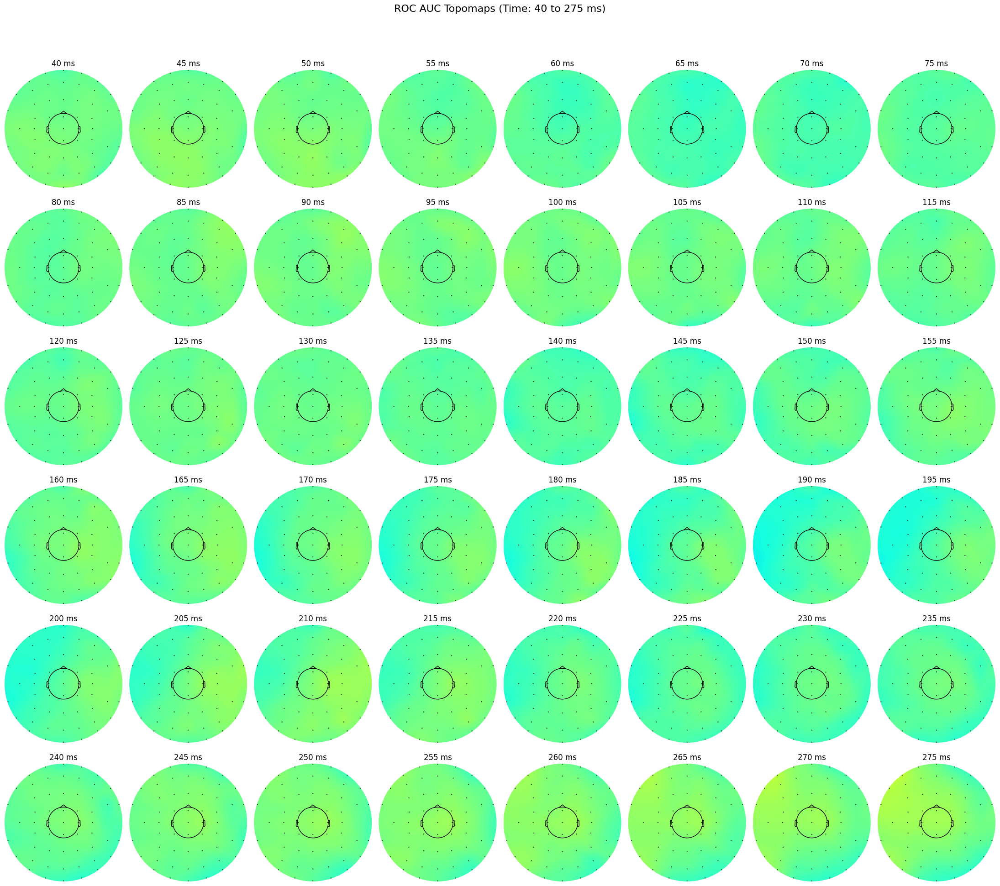

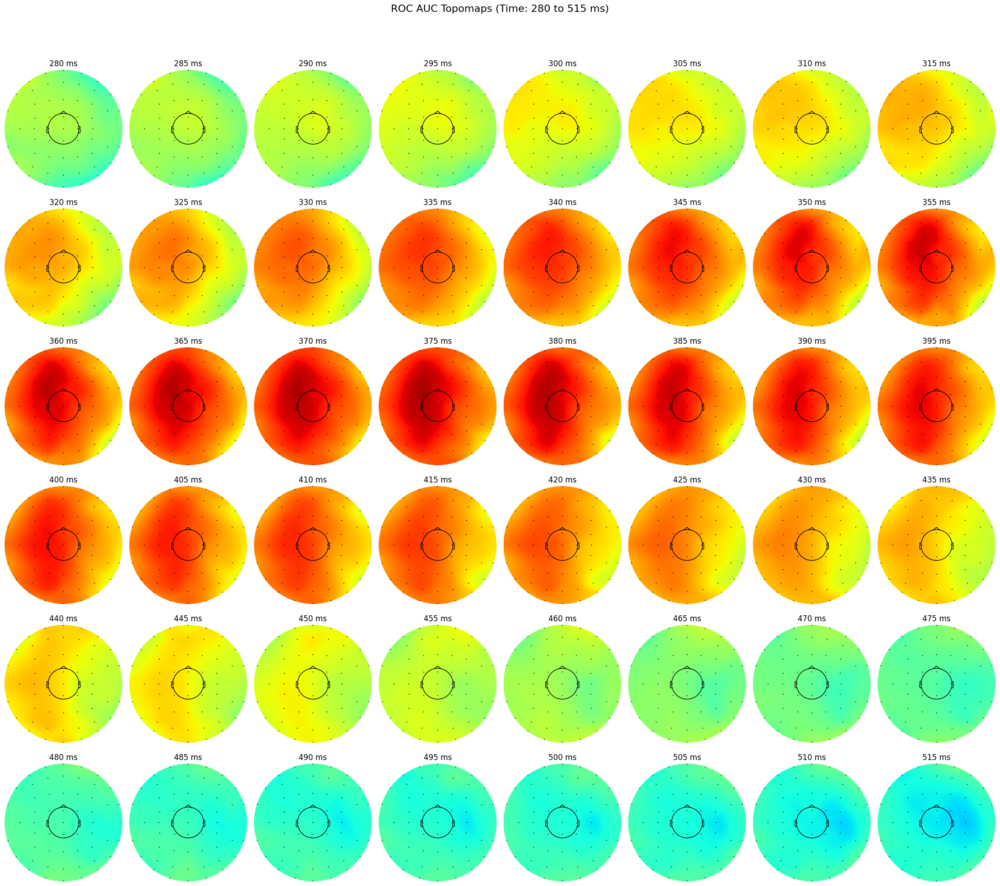

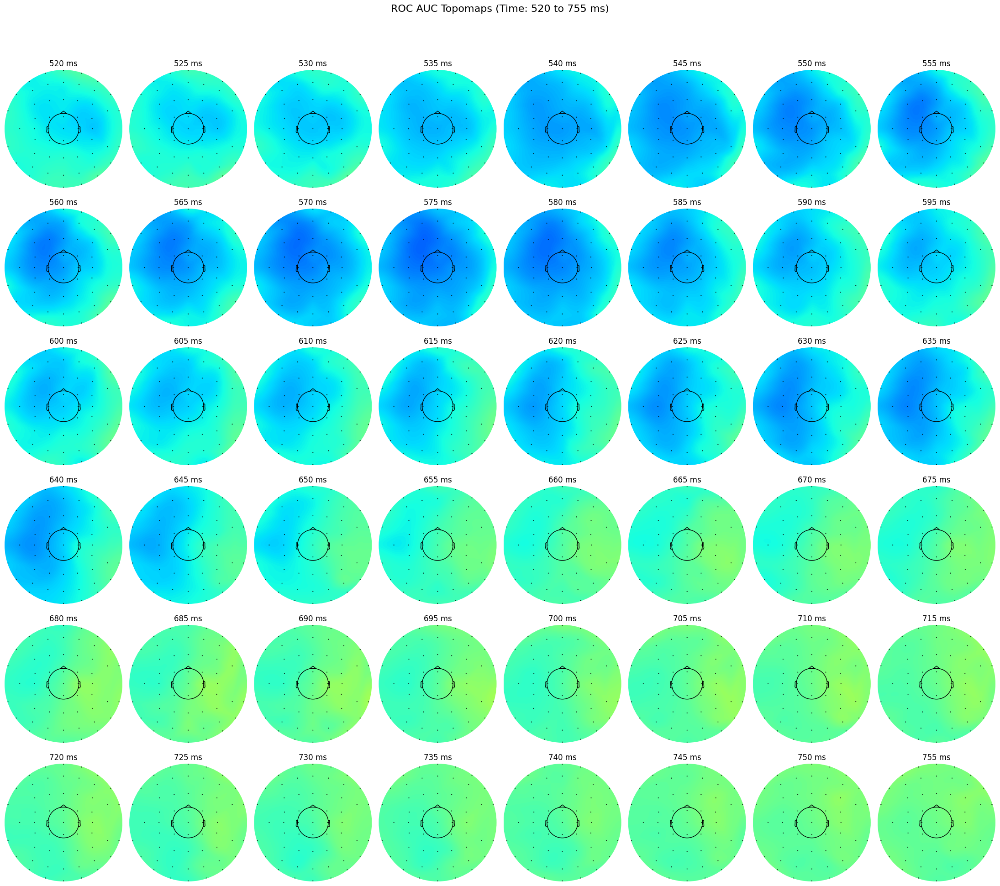

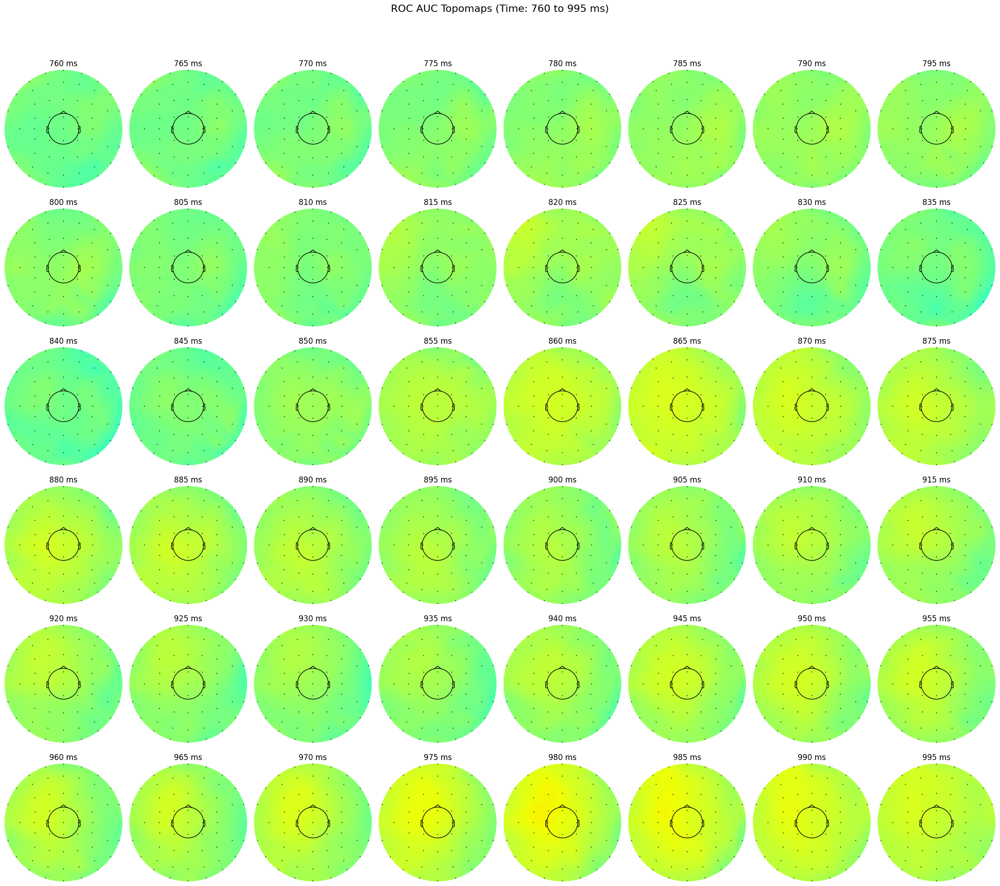

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import mne

# --------------------------------------------
# 1. Load EEG Channel Locations
# --------------------------------------------
df = pd.read_csv("ChannelsLocation.csv")

# Convert spherical (Radius, Phi) -> Cartesian (X, Y, Z)
df["Phi"] = np.deg2rad(df["Phi"])  # Degrees → Radians
df["X"] = df["Radius"] * np.cos(df["Phi"])
df["Y"] = df["Radius"] * np.sin(df["Phi"])
df["Z"] = np.zeros(len(df))  # Assume 2D electrode layout

# Build Montage
ch_pos = {row["Labels"]: [row["X"], row["Y"], row["Z"]] for _, row in df.iterrows()}
montage = mne.channels.make_dig_montage(ch_pos, coord_frame="head")

# Create MNE Info object
ch_names = list(df["Labels"])
info = mne.create_info(ch_names, sfreq=200, ch_types="eeg")
info.set_montage(montage)

# --------------------------------------------
# 2. Load ROC AUC values
# --------------------------------------------
# Assuming `channel_to_roc` and `eeg_channels` are already defined
arr = np.array([channel_to_roc[channel] for channel in eeg_channels])  # Shape: (n_channels, n_timepoints)

# Time labels: from -200 ms to 1000 ms
n_timepoints = arr.shape[1]
time_labels = np.arange(-200, 1005, 5)

# --------------------------------------------
# 3. Plot in Chunks
# --------------------------------------------
chunk_size = 48
n_chunks = int(np.ceil(n_timepoints / chunk_size))

for chunk in range(n_chunks):
    start = chunk * chunk_size
    end = min((chunk + 1) * chunk_size, n_timepoints)
    
    f, ax = plt.subplots(6, 8, figsize=(22, 20))
    ax = ax.ravel()

    for i in range(start, end):
        ax_idx = i - start
        ax[ax_idx].set_title(f"{time_labels[i]} ms")
        mne.viz.plot_topomap(
            arr[:, i], info, size=3, cmap="jet", vlim=(0.35, 0.65),
            show=False, outlines="head", axes=ax[ax_idx], contours=False
        )

    # Hide unused subplots
    for j in range(end - start, 48):
        ax[j].axis("off")
    
    plt.suptitle(f"ROC AUC Topomaps (Time: {time_labels[start]} to {time_labels[end - 1]} ms)", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)  # Adjust space for suptitle
    plt.show()

#### Roc-auc for averaged 5ms window

In [27]:
channel_to_roc = {}

for id, channel in tqdm(enumerate(eeg_channels)):
    channel_data = [epoch[:, id] for epoch in all_epochs]
    channel_data = np.array(channel_data)
    rocs = []
    
    for time_point in range(0, 240, 5):
        time_window_data = channel_data[:, time_point:time_point+5].mean(axis=1) # average voltage over 5 time points (25ms)
        rocs.append(roc_auc_score(all_labels, time_window_data)) # calculate AUC for the time window
    
    channel_to_roc[channel] = rocs

56it [00:10,  5.26it/s]


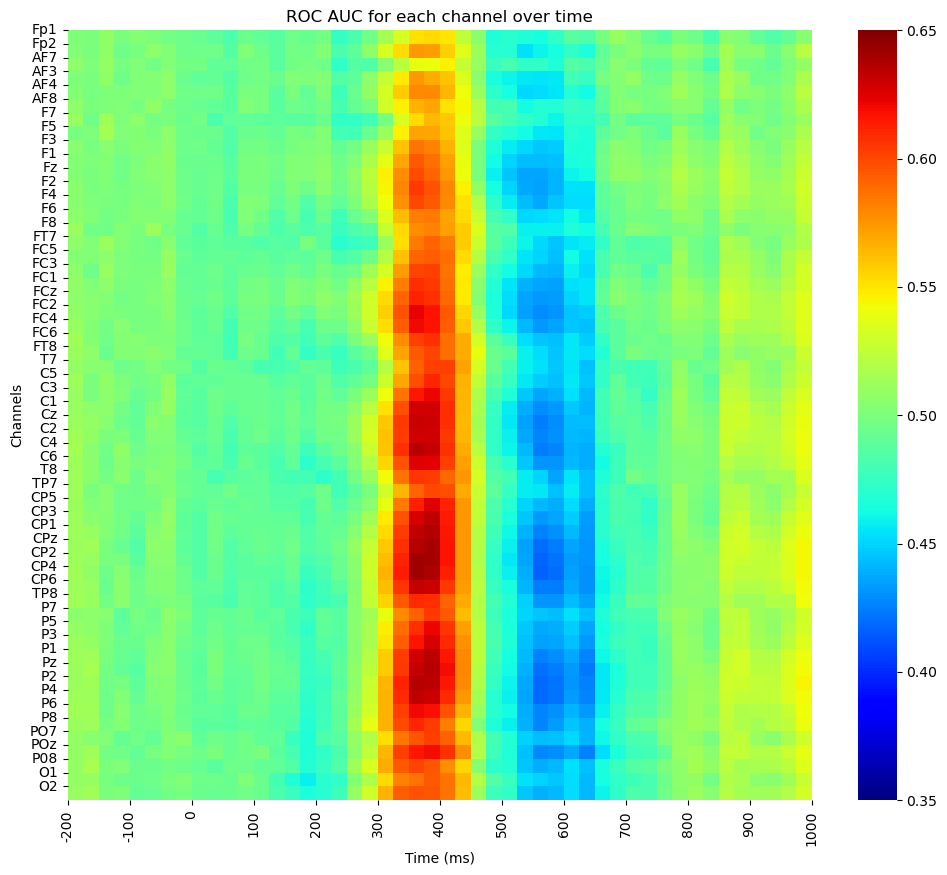

In [28]:
arr = np.array([channel_to_roc[channel] for channel in eeg_channels])
plt.figure(figsize=(12, 10))
sns.heatmap(arr, cmap='jet', vmin=0.35, vmax=0.65)
plt.xticks(np.arange(0, 52, 4), np.arange(-200, 1100, 100), rotation=90)
plt.yticks(np.arange(0, len(eeg_channels)), eeg_channels, rotation=0)
plt.xlabel('Time (ms)')
plt.ylabel('Channels')
plt.title('ROC AUC for each channel over time')
plt.show()

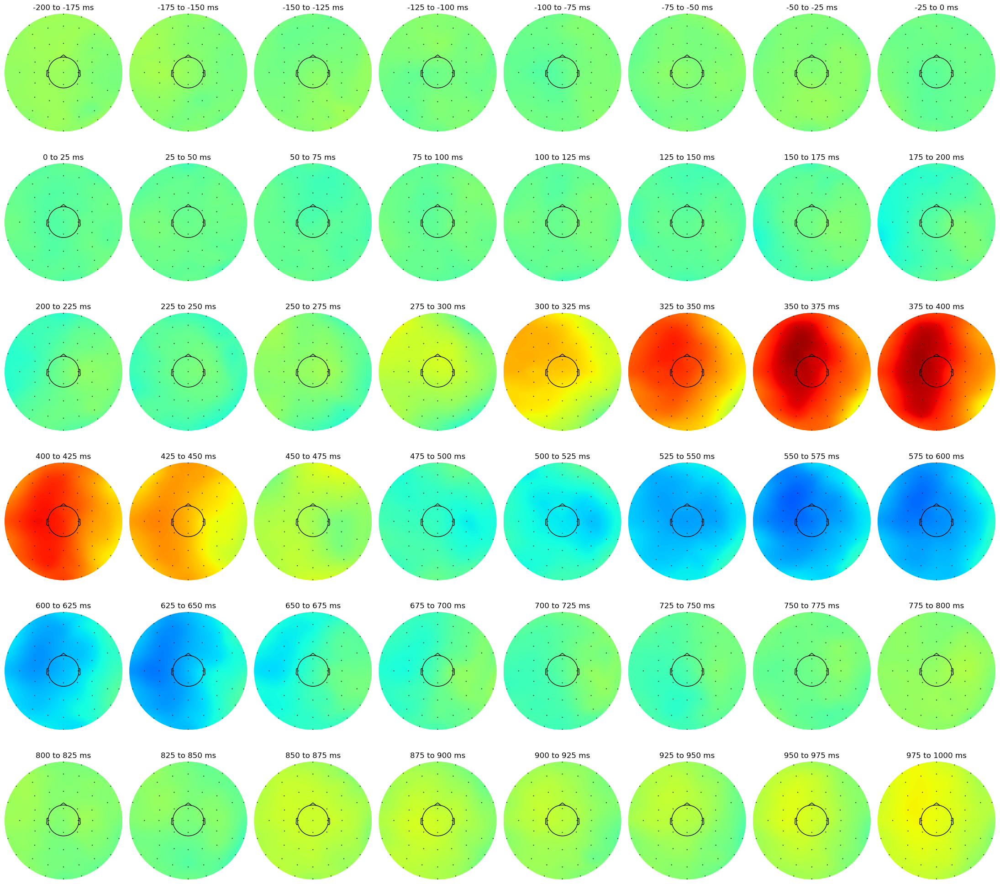

In [29]:
# Load CSV
df = pd.read_csv("dataset/ChannelsLocation.csv")

# Convert spherical (Radius, Phi) -> Cartesian (X, Y, Z)
df["Phi"] = np.deg2rad(df["Phi"])  # Convert degrees to radians
df["X"] = df["Radius"] * np.cos(df["Phi"])
df["Y"] = df["Radius"] * np.sin(df["Phi"])
df["Z"] = np.zeros(len(df))  # Assume all electrodes lie on a 2D plane

# Create Montage
ch_pos = {row["Labels"]: [row["X"], row["Y"], row["Z"]] for _, row in df.iterrows()}
montage = mne.channels.make_dig_montage(ch_pos, coord_frame="head")

# Create info object
ch_names = list(df["Labels"])
info = mne.create_info(ch_names, sfreq=200, ch_types="eeg")
info.set_montage(montage)

# Example: Plot Topomap with Random Data
f, ax = plt.subplots(6, 8, figsize=(22, 20))
ax = ax.ravel()

for i in range(0, 48):
    ax[i].set_title(f"{(i - 8)*25} to {(i - 7)*25} ms")
    mne.viz.plot_topomap(arr[:, i], info, size=3, cmap="jet", vlim=(0.35, 0.65), 
                        show=False, outlines="head", axes=ax[i], contours=False)

plt.tight_layout()
plt.show()

### Roc-Auc with train and validation split

#### For all data points

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# Step 1: Split epochs into training and validation sets
# Assuming 'all_epochs' is your dataset and 'all_labels' is the corresponding labels

# Split the data into train and validation (80% train, 20% validation)
train_epochs, val_epochs, train_labels, val_labels = train_test_split(
    all_epochs, all_labels, test_size=0.2, random_state=42)

# Step 2: Compute ROC-AUC for each channel using only the training data
channel_to_roc = {}

for id, channel in tqdm(enumerate(eeg_channels)):
    # Get the channel data for training epochs only
    channel_data_train = [epoch[:, id] for epoch in train_epochs]
    channel_data_train = np.array(channel_data_train)  # Shape: (n_train_epochs, n_timepoints)
    
    print(f"Channel {channel} - channel_data_train shape: {channel_data_train.shape}")
    
    rocs = []
    
    # Loop over each time point (no averaging, calculate AUC for each time point)
    for time_point in range(channel_data_train.shape[1]):  # Looping over time points directly
        time_point_data = channel_data_train[:, time_point]  # Get the data for the current time point
        try:
            roc = roc_auc_score(train_labels, time_point_data)  # Calculate AUC for this time point
            rocs.append(roc)
        except ValueError as e:
            print(f"Error at time_point {time_point} for channel {channel}: {e}")
    
    # Store the ROC-AUC scores for this channel
    channel_to_roc[channel] = rocs

0it [00:00, ?it/s]

Channel Fp1 - channel_data_train shape: (4352, 240)


1it [00:00,  1.77it/s]

Channel Fp2 - channel_data_train shape: (4352, 240)


2it [00:01,  1.66it/s]

Channel AF7 - channel_data_train shape: (4352, 240)


3it [00:01,  1.67it/s]

Channel AF3 - channel_data_train shape: (4352, 240)


4it [00:02,  1.69it/s]

Channel AF4 - channel_data_train shape: (4352, 240)


5it [00:02,  1.73it/s]

Channel AF8 - channel_data_train shape: (4352, 240)


6it [00:03,  1.70it/s]

Channel F7 - channel_data_train shape: (4352, 240)


7it [00:04,  1.76it/s]

Channel F5 - channel_data_train shape: (4352, 240)


8it [00:04,  1.76it/s]

Channel F3 - channel_data_train shape: (4352, 240)


9it [00:05,  1.77it/s]

Channel F1 - channel_data_train shape: (4352, 240)


10it [00:05,  1.79it/s]

Channel Fz - channel_data_train shape: (4352, 240)


11it [00:06,  1.80it/s]

Channel F2 - channel_data_train shape: (4352, 240)


12it [00:06,  1.82it/s]

Channel F4 - channel_data_train shape: (4352, 240)


13it [00:07,  1.79it/s]

Channel F6 - channel_data_train shape: (4352, 240)


14it [00:07,  1.74it/s]

Channel F8 - channel_data_train shape: (4352, 240)


15it [00:08,  1.78it/s]

Channel FT7 - channel_data_train shape: (4352, 240)


16it [00:09,  1.79it/s]

Channel FC5 - channel_data_train shape: (4352, 240)


17it [00:09,  1.80it/s]

Channel FC3 - channel_data_train shape: (4352, 240)


18it [00:10,  1.78it/s]

Channel FC1 - channel_data_train shape: (4352, 240)


19it [00:10,  1.71it/s]

Channel FCz - channel_data_train shape: (4352, 240)


20it [00:11,  1.64it/s]

Channel FC2 - channel_data_train shape: (4352, 240)


21it [00:12,  1.66it/s]

Channel FC4 - channel_data_train shape: (4352, 240)


22it [00:12,  1.72it/s]

Channel FC6 - channel_data_train shape: (4352, 240)


23it [00:13,  1.75it/s]

Channel FT8 - channel_data_train shape: (4352, 240)


24it [00:13,  1.76it/s]

Channel T7 - channel_data_train shape: (4352, 240)


25it [00:14,  1.80it/s]

Channel C5 - channel_data_train shape: (4352, 240)


26it [00:14,  1.82it/s]

Channel C3 - channel_data_train shape: (4352, 240)


27it [00:15,  1.84it/s]

Channel C1 - channel_data_train shape: (4352, 240)


28it [00:15,  1.85it/s]

Channel Cz - channel_data_train shape: (4352, 240)


29it [00:16,  1.86it/s]

Channel C2 - channel_data_train shape: (4352, 240)


30it [00:16,  1.85it/s]

Channel C4 - channel_data_train shape: (4352, 240)


31it [00:17,  1.82it/s]

Channel C6 - channel_data_train shape: (4352, 240)


32it [00:18,  1.83it/s]

Channel T8 - channel_data_train shape: (4352, 240)


33it [00:18,  1.83it/s]

Channel TP7 - channel_data_train shape: (4352, 240)


34it [00:19,  1.77it/s]

Channel CP5 - channel_data_train shape: (4352, 240)


35it [00:19,  1.78it/s]

Channel CP3 - channel_data_train shape: (4352, 240)


36it [00:20,  1.80it/s]

Channel CP1 - channel_data_train shape: (4352, 240)


37it [00:20,  1.78it/s]

Channel CPz - channel_data_train shape: (4352, 240)


38it [00:21,  1.71it/s]

Channel CP2 - channel_data_train shape: (4352, 240)


39it [00:22,  1.76it/s]

Channel CP4 - channel_data_train shape: (4352, 240)


40it [00:22,  1.77it/s]

Channel CP6 - channel_data_train shape: (4352, 240)


41it [00:23,  1.78it/s]

Channel TP8 - channel_data_train shape: (4352, 240)


42it [00:23,  1.75it/s]

Channel P7 - channel_data_train shape: (4352, 240)


43it [00:24,  1.74it/s]

Channel P5 - channel_data_train shape: (4352, 240)


44it [00:24,  1.78it/s]

Channel P3 - channel_data_train shape: (4352, 240)


45it [00:25,  1.78it/s]

Channel P1 - channel_data_train shape: (4352, 240)


46it [00:25,  1.79it/s]

Channel Pz - channel_data_train shape: (4352, 240)


47it [00:26,  1.72it/s]

Channel P2 - channel_data_train shape: (4352, 240)


48it [00:27,  1.66it/s]

Channel P4 - channel_data_train shape: (4352, 240)


49it [00:27,  1.69it/s]

Channel P6 - channel_data_train shape: (4352, 240)


50it [00:28,  1.72it/s]

Channel P8 - channel_data_train shape: (4352, 240)


51it [00:28,  1.74it/s]

Channel PO7 - channel_data_train shape: (4352, 240)


52it [00:29,  1.74it/s]

Channel POz - channel_data_train shape: (4352, 240)


53it [00:30,  1.70it/s]

Channel P08 - channel_data_train shape: (4352, 240)


54it [00:30,  1.74it/s]

Channel O1 - channel_data_train shape: (4352, 240)


55it [00:31,  1.74it/s]

Channel O2 - channel_data_train shape: (4352, 240)


56it [00:31,  1.76it/s]


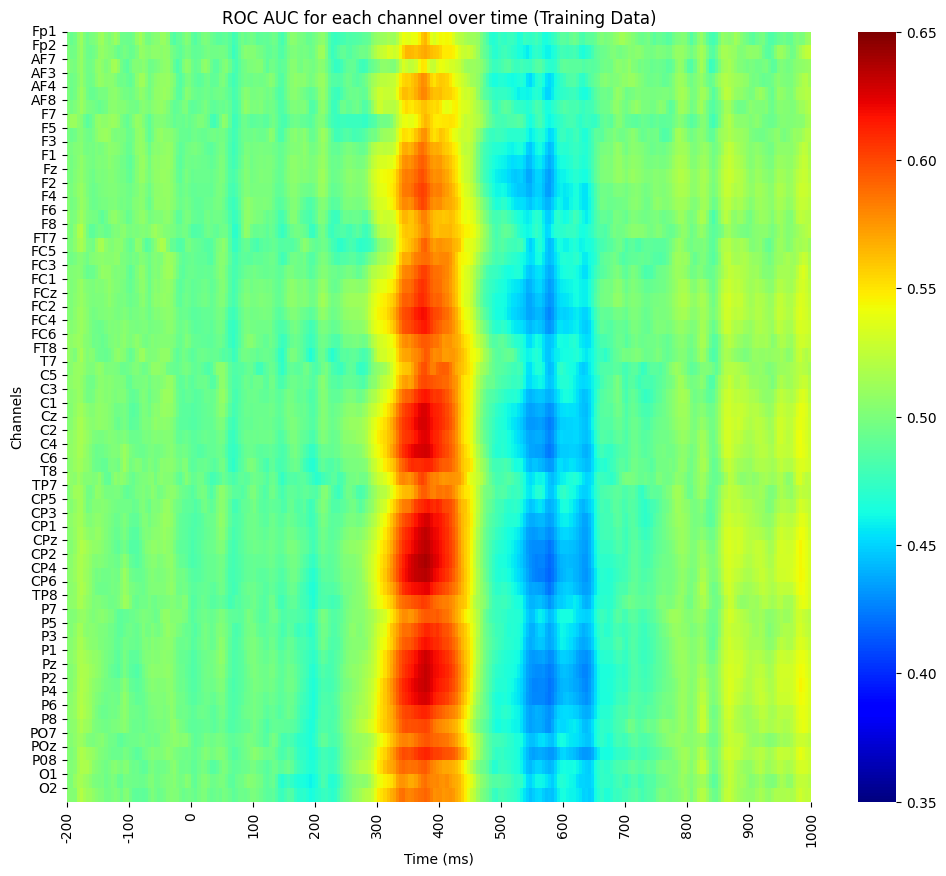

In [39]:
# Step 3: Plot the ROC-AUC heatmap for training data
arr = np.array([channel_to_roc[channel] for channel in eeg_channels])

# Generate time labels from -200 ms to 1000 ms, rounded to integers
time_labels = np.arange(-200, 1005, 100)

# Plotting
plt.figure(figsize=(12, 10))
sns.heatmap(arr, cmap='jet', vmin=0.35, vmax=0.65)

# Adjust xticks to show every 5th timepoint for better readability
plt.xticks(np.arange(0, 260, 20), time_labels, rotation=90)  
plt.yticks(np.arange(0, len(eeg_channels)), eeg_channels, rotation=0)

# Labeling the axes and title
plt.xlabel('Time (ms)')
plt.ylabel('Channels')
plt.title('ROC AUC for each channel over time (Training Data)')

# Display the plot
plt.show()

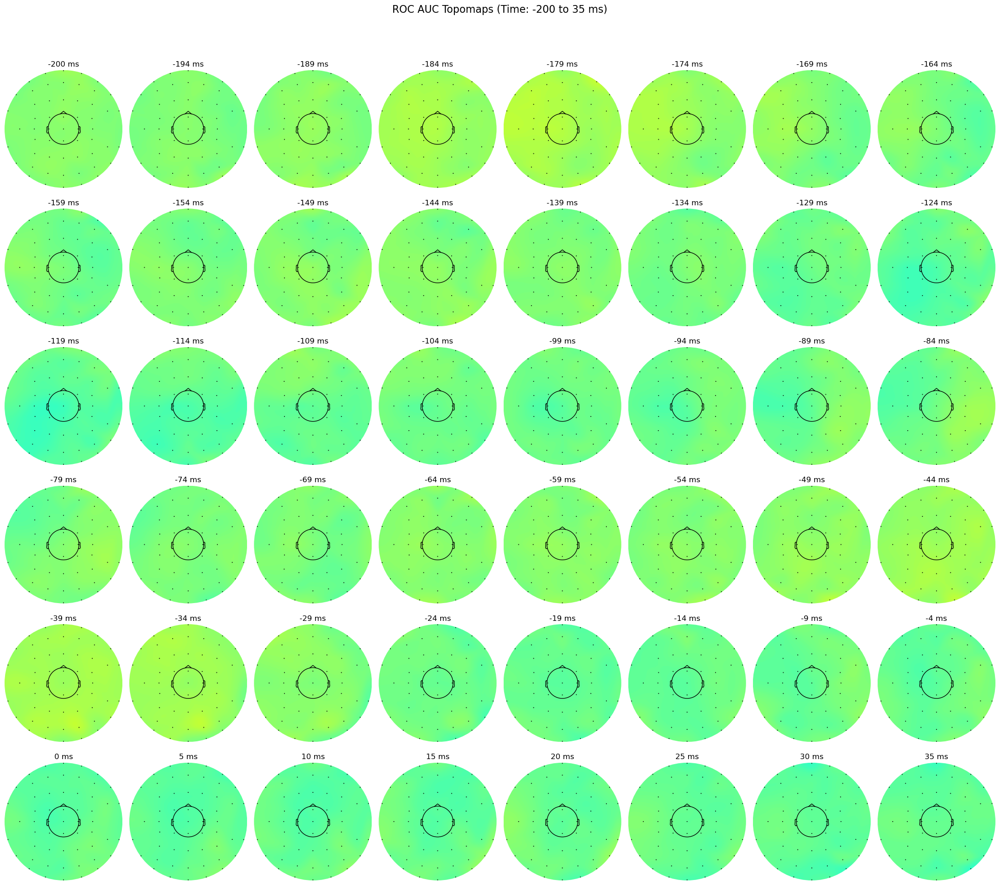

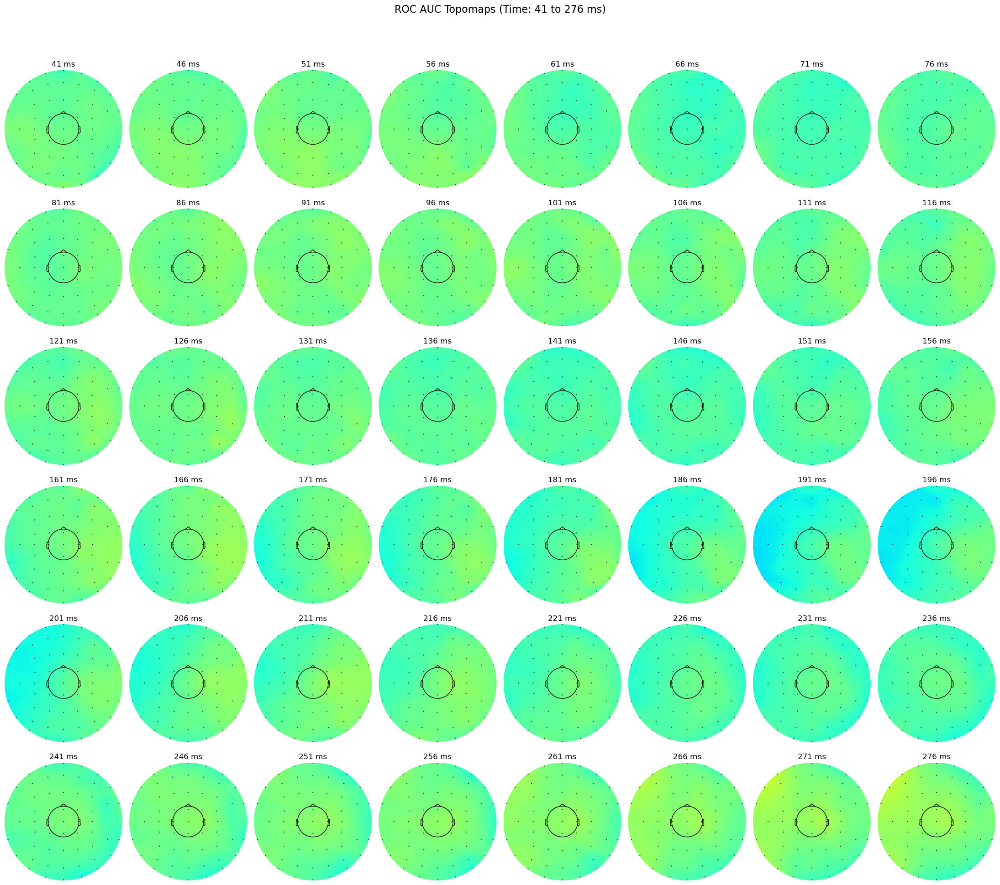

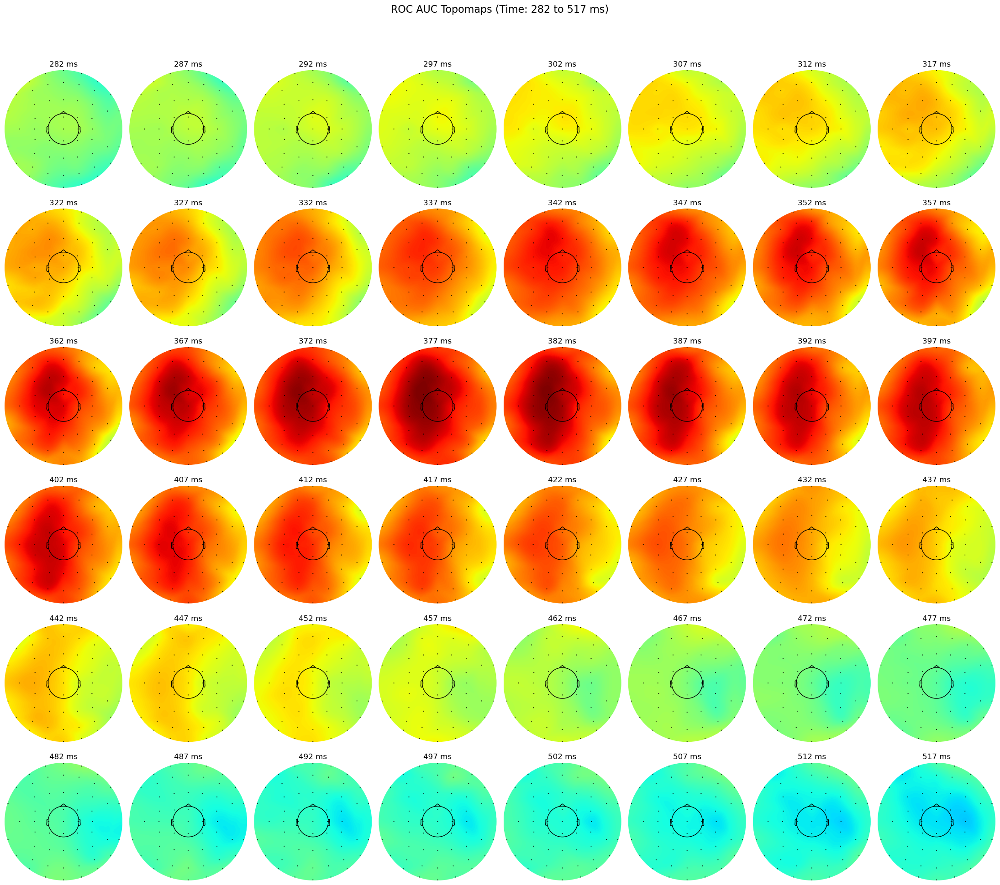

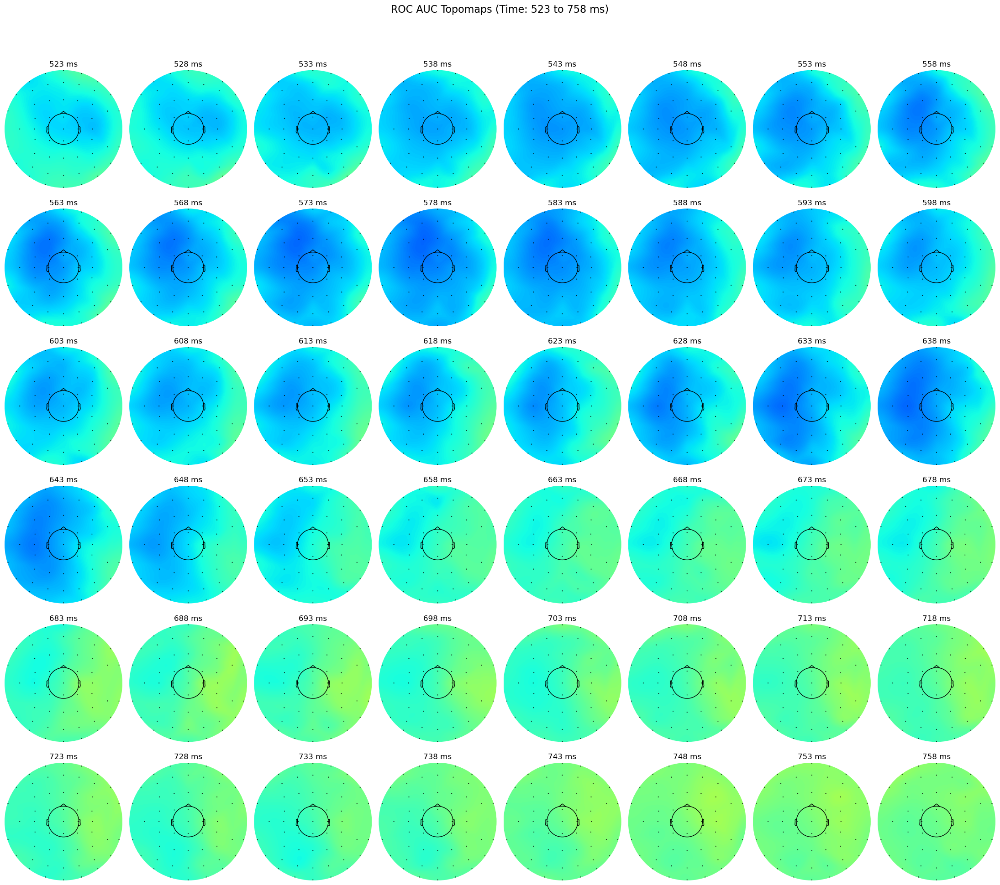

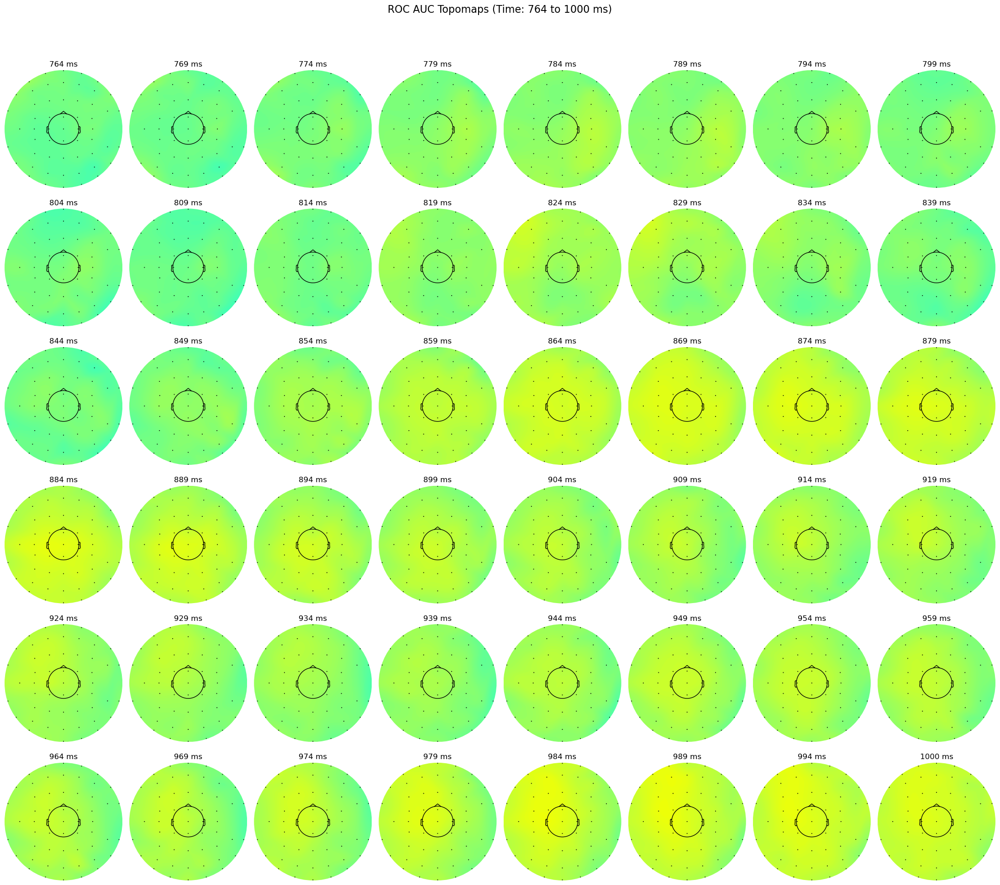

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import mne

# --------------------------------------------
# 1. Load EEG Channel Locations
# --------------------------------------------
df = pd.read_csv("dataset/ChannelsLocation.csv")

# Convert spherical (Radius, Phi) -> Cartesian (X, Y, Z)
df["Phi"] = np.deg2rad(df["Phi"])  # Degrees → Radians
df["X"] = df["Radius"] * np.cos(df["Phi"])
df["Y"] = df["Radius"] * np.sin(df["Phi"])
df["Z"] = np.zeros(len(df))  # Assume 2D electrode layout

# Build Montage
ch_pos = {row["Labels"]: [row["X"], row["Y"], row["Z"]] for _, row in df.iterrows()}
montage = mne.channels.make_dig_montage(ch_pos, coord_frame="head")

# Create MNE Info object
ch_names = list(df["Labels"])
info = mne.create_info(ch_names, sfreq=200, ch_types="eeg")
info.set_montage(montage)

# --------------------------------------------
# 2. Load ROC AUC values
# --------------------------------------------
# Assuming `channel_to_roc` and `eeg_channels` are already defined
arr = np.array([channel_to_roc[channel] for channel in eeg_channels])  # Shape: (n_channels, n_timepoints)

# Time labels: from -200 ms to 1000 ms
n_timepoints = arr.shape[1]
time_labels = np.linspace(-200, 1000, n_timepoints).astype(int)
#time_labels = np.linspace(-200, 1000, 240)


# --------------------------------------------
# 3. Plot in Chunks
# --------------------------------------------
chunk_size = 48
n_chunks = int(np.ceil(n_timepoints / chunk_size))

for chunk in range(n_chunks):
    start = chunk * chunk_size
    end = min((chunk + 1) * chunk_size, n_timepoints)
    
    f, ax = plt.subplots(6, 8, figsize=(22, 20))
    ax = ax.ravel()

    for i in range(start, end):
        ax_idx = i - start
        ax[ax_idx].set_title(f"{time_labels[i]} ms")
        mne.viz.plot_topomap(
            arr[:, i], info, size=3, cmap="jet", vlim=(0.35, 0.65),
            show=False, outlines="head", axes=ax[ax_idx], contours=False
        )

    # Hide unused subplots
    for j in range(end - start, 48):
        ax[j].axis("off")
    
    plt.suptitle(f"ROC AUC Topomaps (Time: {time_labels[start]} to {time_labels[end - 1]} ms)", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)  # Adjust space for suptitle
    plt.show()

In [8]:
print(arr.shape[1]) 


240


#### This is to make fun gif)

In [56]:
fig, ax = plt.subplots(figsize=(6, 5))

# Initialize the first frame
im, _ = mne.viz.plot_topomap(
    arr[:, 0], info, axes=ax, cmap='jet', vlim=(0.35, 0.65),
    show=False, contours=False, outlines='head'
)
title = ax.set_title(f"{time_labels[0]} ms", fontsize=14)

def animate(i):
    ax.clear()
    im, _ = mne.viz.plot_topomap(
        arr[:, i], info, axes=ax, cmap='jet', vlim=(0.35, 0.65),
        show=False, contours=False, outlines='head'
    )
    ax.set_title(f"{time_labels[i]} ms", fontsize=14)
    return [im]

# Create animation: interval=50ms between frames, adjust as you like
ani = animation.FuncAnimation(fig, animate, frames=arr.shape[1], interval=50, blit=False)

# Save the animation as GIF or MP4
ani.save("topomap_animation.gif", writer="pillow", fps=15)
# ani.save("topomap_animation.mp4", writer="ffmpeg", fps=20)

plt.close()  # close the figure to prevent static display in notebooks

#### Taking all the data points from preprocessed EEG, no specific feature engineering

In [5]:
X = []
features = [f"{channel} voltage at {time_point * 5 - 200} ms" for channel in eeg_channels for time_point in range(240)]

for id in tqdm(range(len(eeg_channels))):
    channel_data = [epoch[:, id] for epoch in all_epochs]  # shape: (n_epochs, n_timepoints)
    channel_data = np.array(channel_data)  # shape: (n_epochs, 240)

    for time_point in range(240):  # all time points from -200 to 1000 ms
        time_point_data = channel_data[:, time_point]  # shape: (n_epochs,)
        X.append(time_point_data)

X = np.array(X).T  # shape: (n_samples, n_features)
print(X.shape)

100%|██████████████████████████████████████████████████████████████████████████████████| 56/56 [00:02<00:00, 27.52it/s]


(5440, 13440)


In [6]:
# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, all_labels, test_size=0.2, random_state=42)

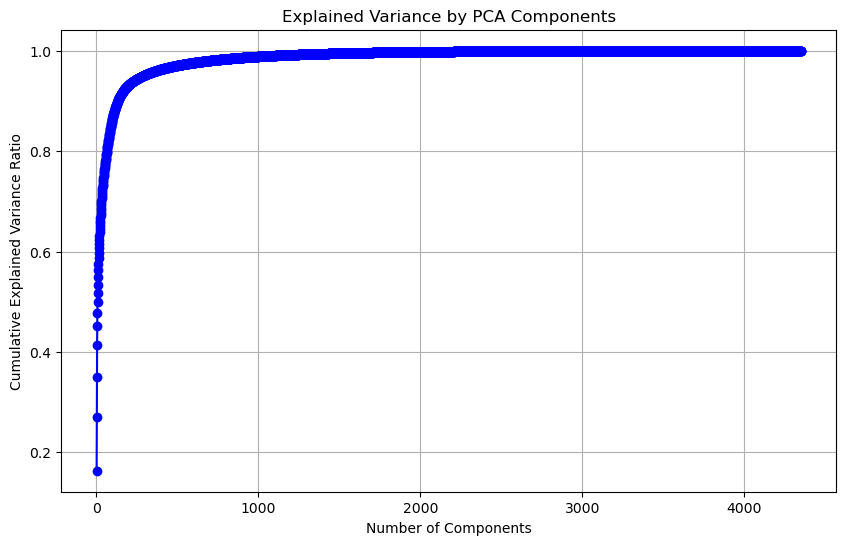

Number of components to explain variance:
90.0% variance: 133 components
95.0% variance: 287 components
97.5% variance: 577 components
99.0% variance: 1079 components
99.9% variance: 2463 components


In [79]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Perform PCA
pca = PCA()
X_train_pca = pca.fit_transform(X_train_scaled)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Cumulative explained variance
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Plot explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_variance_ratio, 'bo-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Explained Variance by PCA Components')
plt.grid(True)
plt.show()

# Determine number of components for different variance thresholds
variance_thresholds = [0.90, 0.95, 0.975, 0.99, 0.999]
components_for_thresholds = {
    threshold: np.argmax(cumulative_variance_ratio >= threshold) + 1 
    for threshold in variance_thresholds
}

print("Number of components to explain variance:")
for threshold, num_components in components_for_thresholds.items():
    print(f"{threshold*100}% variance: {num_components} components")

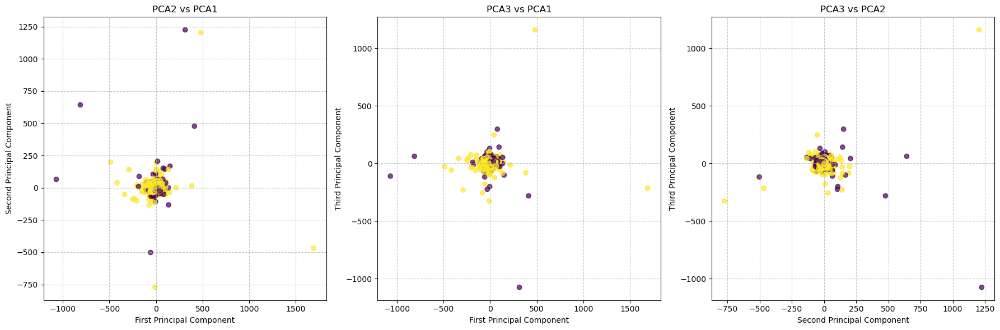

Variance explained by first 3 principal components:
PC1: 0.1635 (16.35%)
PC2: 0.1074 (10.74%)
PC3: 0.0802 (8.02%)
Total: 0.3510 (35.10%)


In [80]:
# Create a figure with 3 subplots for PCA visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot PCA2 vs PCA1
scatter1 = axes[0].scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis', alpha=0.7)
axes[0].set_xlabel('First Principal Component')
axes[0].set_ylabel('Second Principal Component')
axes[0].set_title('PCA2 vs PCA1')
axes[0].grid(True, linestyle='--', alpha=0.7)

# Plot PCA3 vs PCA1
scatter2 = axes[1].scatter(X_train_pca[:, 0], X_train_pca[:, 2], c=y_train, cmap='viridis', alpha=0.7)
axes[1].set_xlabel('First Principal Component')
axes[1].set_ylabel('Third Principal Component')
axes[1].set_title('PCA3 vs PCA1')
axes[1].grid(True, linestyle='--', alpha=0.7)

# Plot PCA3 vs PCA2
scatter3 = axes[2].scatter(X_train_pca[:, 1], X_train_pca[:, 2], c=y_train, cmap='viridis', alpha=0.7)
axes[2].set_xlabel('Second Principal Component')
axes[2].set_ylabel('Third Principal Component')
axes[2].set_title('PCA3 vs PCA2')
axes[2].grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# Display variance explained by the first three components
print(f"Variance explained by first 3 principal components:")
print(f"PC1: {explained_variance_ratio[0]:.4f} ({explained_variance_ratio[0]*100:.2f}%)")
print(f"PC2: {explained_variance_ratio[1]:.4f} ({explained_variance_ratio[1]*100:.2f}%)")
print(f"PC3: {explained_variance_ratio[2]:.4f} ({explained_variance_ratio[2]*100:.2f}%)")
print(f"Total: {sum(explained_variance_ratio[:3]):.4f} ({sum(explained_variance_ratio[:3])*100:.2f}%)")

If the features were more independent, you'd expect fewer components to explain most of the variance.

The fact that you need 1079 components to explain just 99% of variance shows:

A lot of dimensions carry very little unique information.

There's high multicollinearity — especially across time (EEG at t, t+1, etc. is usually very autocorrelated).

In [7]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Perform PCA to retain 95% of the variance
pca = PCA(n_components=0.95)  # This will retain enough components to explain 95% of the variance
X_train_pca = pca.fit_transform(X_train_scaled)

print(f"Number of components chosen by PCA: {pca.n_components_}")
print(f"Variance explained by the selected components: {sum(pca.explained_variance_ratio_)}")

Number of components chosen by PCA: 287
Variance explained by the selected components: 0.9500260848501818


### LDA

LDA Classification Report:
              precision    recall  f1-score   support

           0       0.46      0.25      0.32       303
           1       0.75      0.89      0.82       785

    accuracy                           0.71      1088
   macro avg       0.61      0.57      0.57      1088
weighted avg       0.67      0.71      0.68      1088



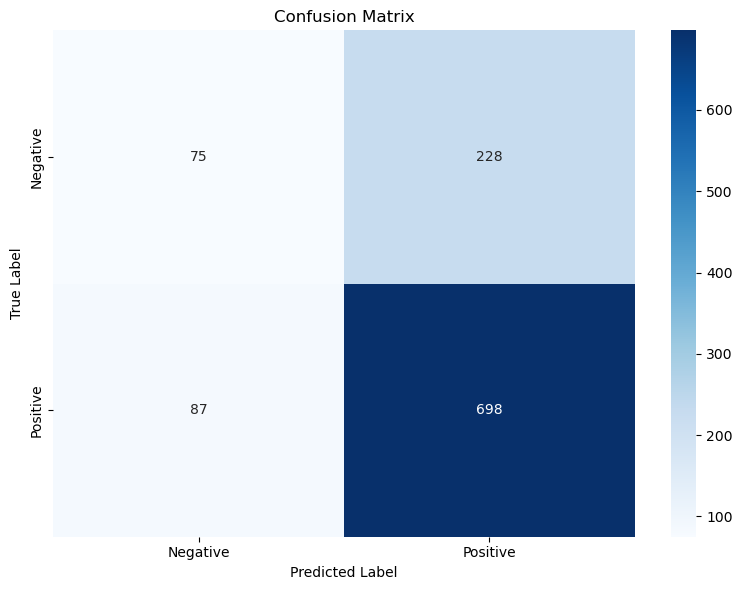

ROC AUC Score: 0.5683


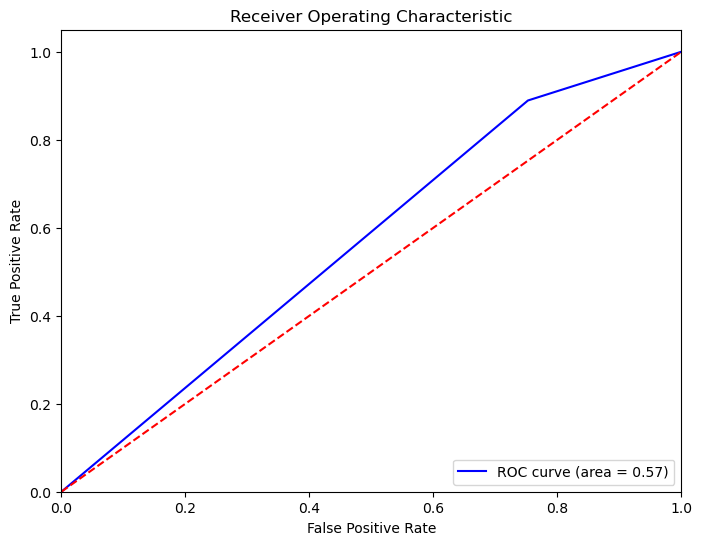

In [8]:
from sklearn.metrics import roc_curve

# Create an LDA model
lda = LDA()
lda.fit(X_train_pca, y_train)

X_test_scaled = scaler.transform(X_test)
X_test_pca = pca.transform(X_test_scaled)
y_pred_lda = lda.predict(X_test_pca)

# Print metrics
print("LDA Classification Report:")
print(classification_report(y_test, y_pred_lda))

# Create confusion matrix display
conf_matrix = confusion_matrix(y_test, y_pred_lda)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC for LDA:
roc_auc_score_value = roc_auc_score(y_test, y_pred_lda)
print(f"ROC AUC Score: {roc_auc_score_value:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_lda)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc_score_value)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

### NCC

Classification Report:
              precision    recall  f1-score   support

           0       0.37      0.55      0.44       303
           1       0.78      0.63      0.70       785

    accuracy                           0.61      1088
   macro avg       0.57      0.59      0.57      1088
weighted avg       0.67      0.61      0.63      1088



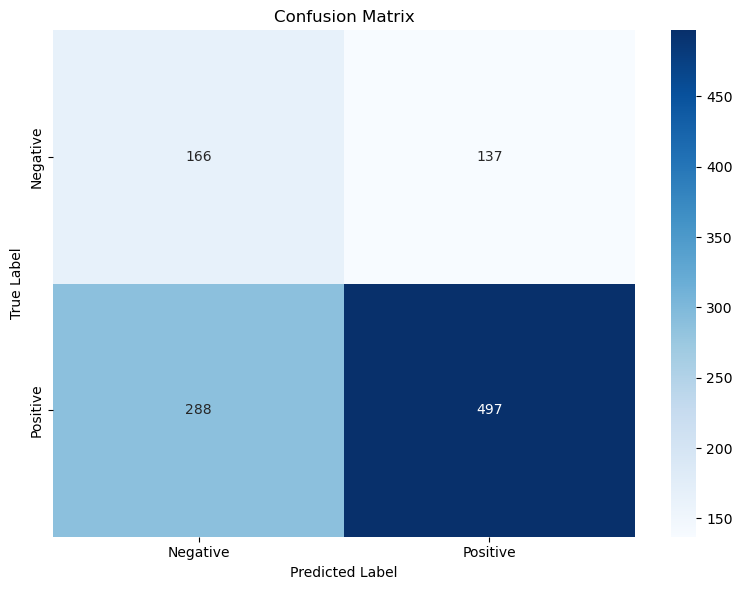

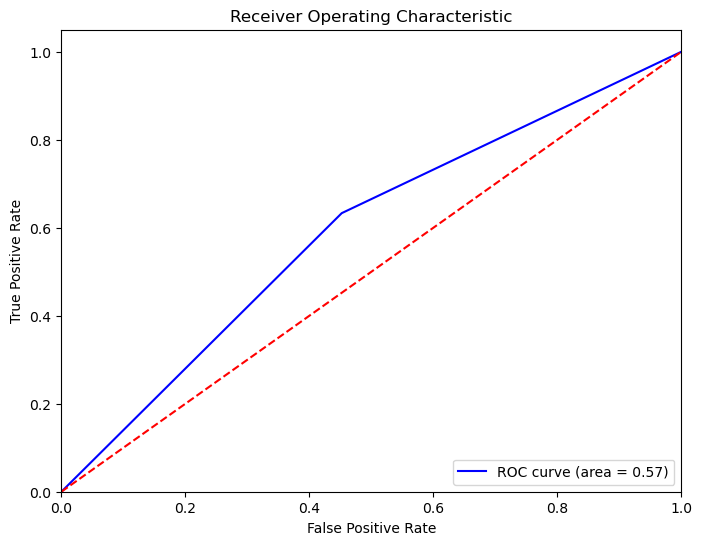

In [9]:
# Let's fit an NCC model

ncc = NCC()
ncc.fit(X_train_pca, y_train)
y_pred_lr = ncc.predict(X_test_pca)

print("Classification Report:")
print(classification_report(y_test, y_pred_lr))

conf_matrix_ncc = confusion_matrix(y_test, y_pred_lr)
conf_matrix = confusion_matrix(y_test, y_pred_lr)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_lr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc_score_value)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

### R-LDA

Regularized LDA (R-LDA) Classification Report:
              precision    recall  f1-score   support

           0       0.46      0.18      0.26       303
           1       0.74      0.92      0.82       785

    accuracy                           0.71      1088
   macro avg       0.60      0.55      0.54      1088
weighted avg       0.67      0.71      0.67      1088



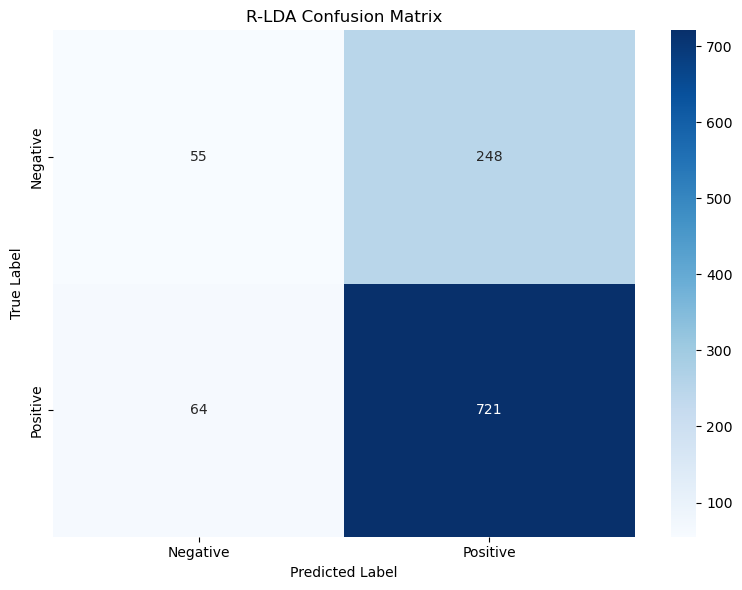

R-LDA ROC AUC Score: 0.5500


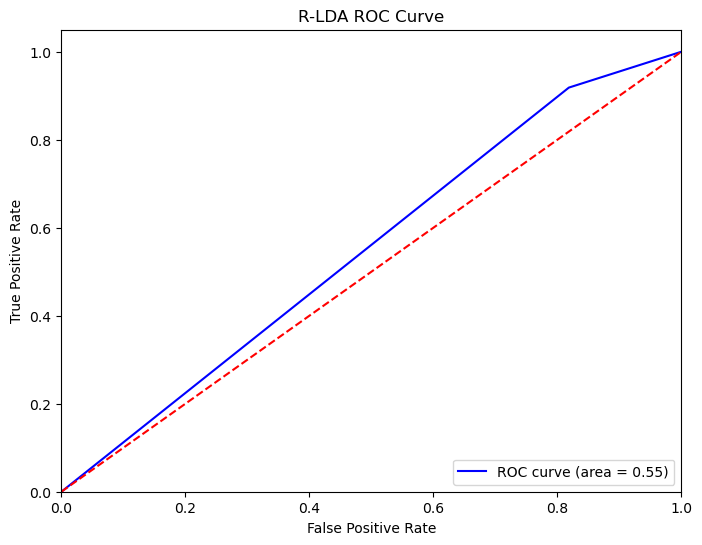

In [21]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# Create and train LDA with shrinkage (real R-LDA)
rlda = LDA(solver='lsqr', shrinkage='auto')  # 'auto' lets sklearn choose optimal shrinkage via Ledoit-Wolf
rlda.fit(X_train_pca, y_train)

# Predict
y_pred_rlda = rlda.predict(X_test_pca)

# Classification report
print("Regularized LDA (R-LDA) Classification Report:")
print(classification_report(y_test, y_pred_rlda))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rlda)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('R-LDA Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC Score
roc_auc = roc_auc_score(y_test, y_pred_rlda)
print(f"R-LDA ROC AUC Score: {roc_auc:.4f}")

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_rlda)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('R-LDA ROC Curve')
plt.legend(loc='lower right')
plt.show()


### RF

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.05      0.09       303
           1       0.73      0.99      0.84       785

    accuracy                           0.73      1088
   macro avg       0.66      0.52      0.47      1088
weighted avg       0.69      0.73      0.63      1088



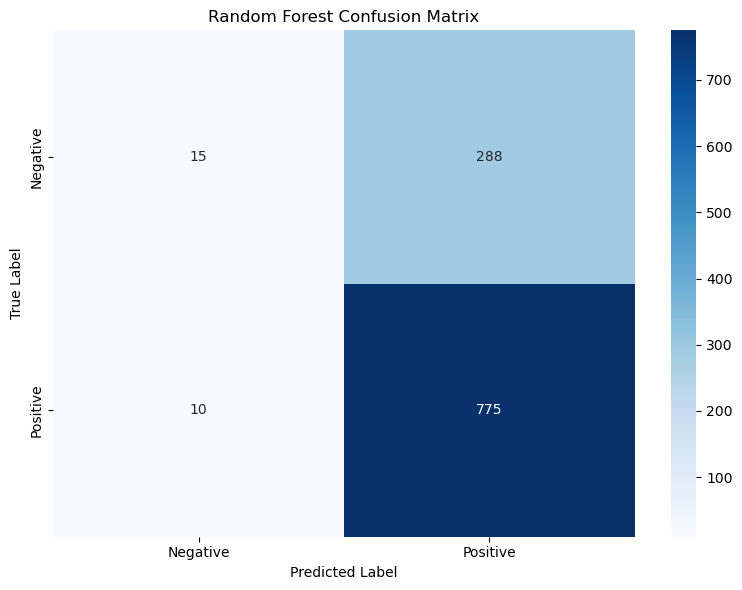

Random Forest ROC AUC Score: 0.5184


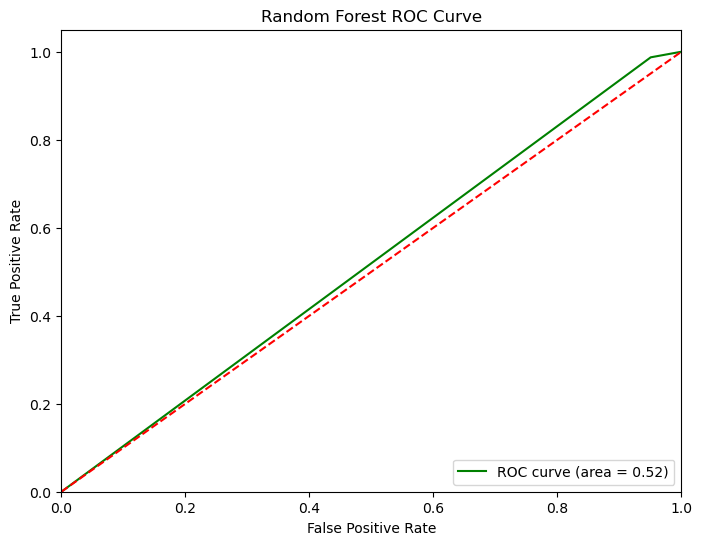

In [24]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_pca, y_train)

# Predict
y_pred_rf = rf.predict(X_test_pca)

# Classification Report
print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Confusion Matrix
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Random Forest Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC Score
roc_auc_rf = roc_auc_score(y_test, y_pred_rf)
print(f"Random Forest ROC AUC Score: {roc_auc_rf:.4f}")

# ROC Curve
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
plt.plot(fpr_rf, tpr_rf, color='green', label='ROC curve (area = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC Curve')
plt.legend(loc='lower right')
plt.show()

### LSTM

Epoch 1/10
136/136 [==============================] - 7s 26ms/step - loss: 0.6092 - accuracy: 0.6797 - val_loss: 0.6005 - val_accuracy: 0.7004
Epoch 2/10
136/136 [==============================] - 3s 23ms/step - loss: 0.5427 - accuracy: 0.7328 - val_loss: 0.5904 - val_accuracy: 0.7215
Epoch 3/10
136/136 [==============================] - 3s 21ms/step - loss: 0.5211 - accuracy: 0.7505 - val_loss: 0.5948 - val_accuracy: 0.7142
Epoch 4/10
136/136 [==============================] - 3s 19ms/step - loss: 0.5020 - accuracy: 0.7633 - val_loss: 0.5982 - val_accuracy: 0.7123
Epoch 5/10
136/136 [==============================] - 3s 24ms/step - loss: 0.4860 - accuracy: 0.7753 - val_loss: 0.6024 - val_accuracy: 0.7105
Epoch 6/10
136/136 [==============================] - 3s 20ms/step - loss: 0.4769 - accuracy: 0.7792 - val_loss: 0.6002 - val_accuracy: 0.6985
Epoch 7/10
136/136 [==============================] - 3s 22ms/step - loss: 0.4646 - accuracy: 0.7824 - val_loss: 0.6167 - val_accuracy: 0.6912

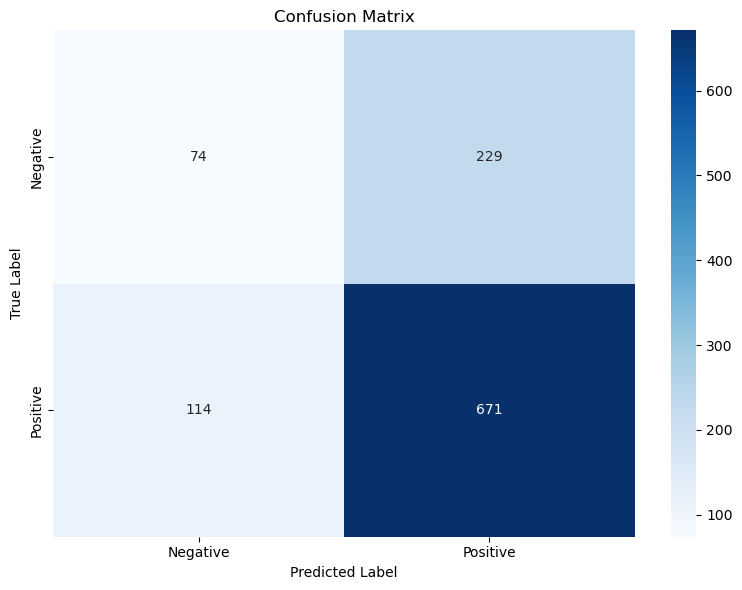

ROC AUC Score: 0.5495


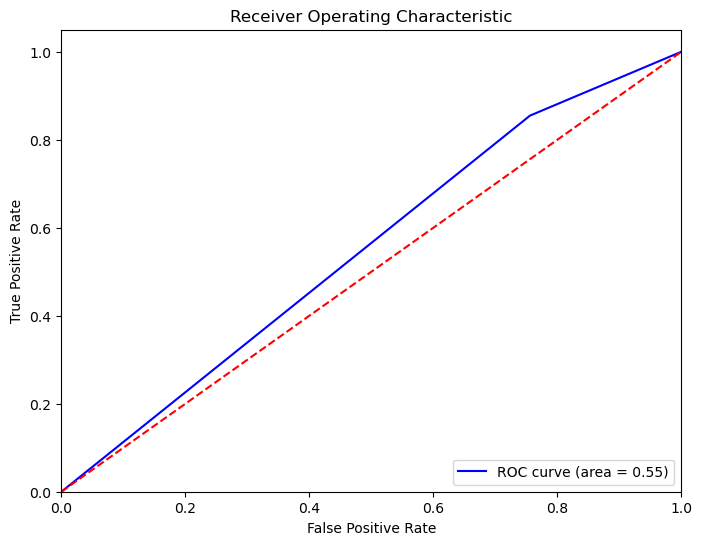

In [27]:
# Assuming X_train and X_test are the raw time-series data
# Reshape to 3D: [samples, time_steps, features]
time_steps = 10  # Adjust according to your sequence length
X_train_reshaped = X_train.reshape(X_train.shape[0], time_steps, X_train.shape[1] // time_steps)
X_test_reshaped = X_test.reshape(X_test.shape[0], time_steps, X_test.shape[1] // time_steps)

# Create LSTM model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Create LSTM model
model = Sequential()
model.add(LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), return_sequences=False))
model.add(Dense(1, activation='sigmoid'))  # For binary classification (adjust for multi-class)

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32, validation_data=(X_test_reshaped, y_test))

# Make predictions
y_pred = model.predict(X_test_reshaped)
y_pred = (y_pred > 0.5).astype(int)  # Convert to binary class (0 or 1)

# Print classification report
print("LSTM Classification Report:")
print(classification_report(y_test, y_pred))

# Create confusion matrix display
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC for LSTM
roc_auc_score_value = roc_auc_score(y_test, y_pred)
print(f"ROC AUC Score: {roc_auc_score_value:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc_score_value)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

### Testing on 'Balanced Dataset' by undersampling 

In [28]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

# Step 1: Combine features and labels
df = pd.DataFrame(X)
df['label'] = all_labels

# Step 2: Separate majority and minority classes
class_0 = df[df['label'] == 0]
class_1 = df[df['label'] == 1]

# Step 3: Undersample class 1
class_1_downsampled = resample(class_1,
                               replace=False,
                               n_samples=len(class_0),
                               random_state=42)

# Step 4: Combine and shuffle
balanced_df = pd.concat([class_0, class_1_downsampled])
balanced_df = balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Step 5: Split into features and labels
X_balanced = balanced_df.drop('label', axis=1).values
y_balanced = balanced_df['label'].values

# Step 6: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)

# Done!
print("Class distribution after balancing:", np.bincount(y_balanced))
print("Training set shape:", X_train.shape)
print("Test set shape:", X_test.shape)


Class distribution after balancing: [1590 1590]
Training set shape: (2544, 13440)
Test set shape: (636, 13440)


In [29]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Perform PCA to retain 95% of the variance
pca = PCA(n_components=0.95)  # This will retain enough components to explain 95% of the variance
X_train_pca = pca.fit_transform(X_train_scaled)

print(f"Number of components chosen by PCA: {pca.n_components_}")
print(f"Variance explained by the selected components: {sum(pca.explained_variance_ratio_)}")

Number of components chosen by PCA: 255
Variance explained by the selected components: 0.9501130882358254


LDA Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.61      0.63       335
           1       0.59      0.63      0.61       301

    accuracy                           0.62       636
   macro avg       0.62      0.62      0.62       636
weighted avg       0.62      0.62      0.62       636



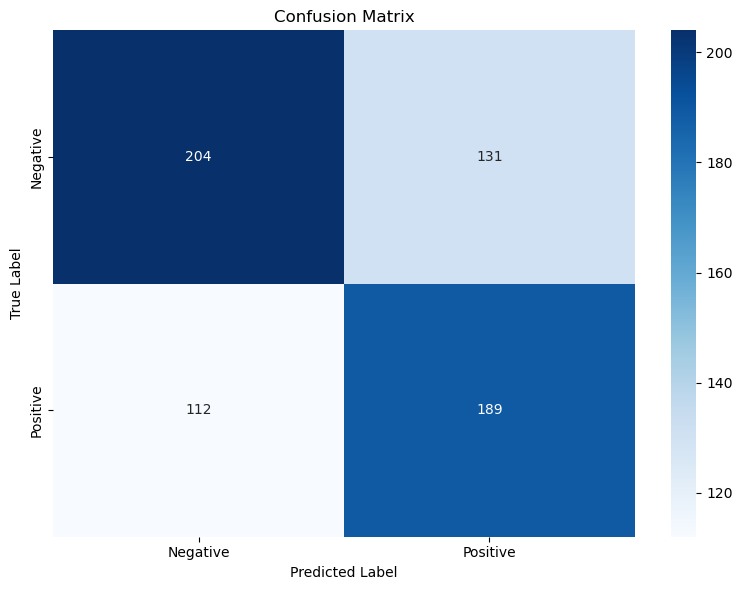

ROC AUC Score: 0.6184


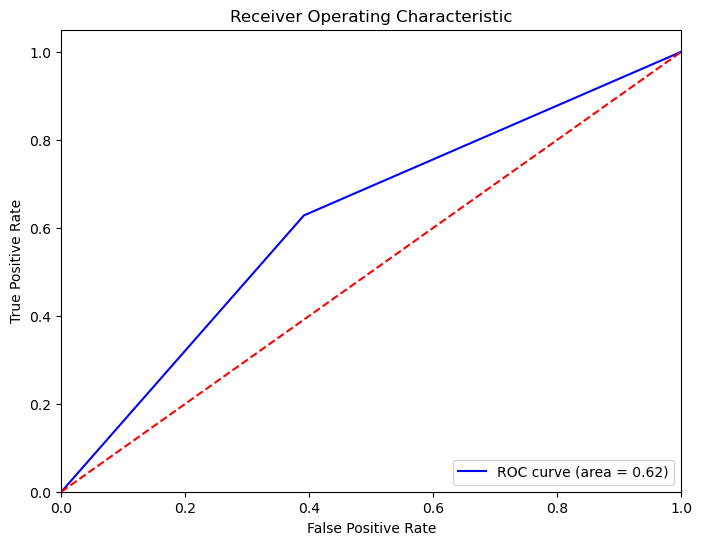

In [30]:
from sklearn.metrics import roc_curve

# Create an LDA model
lda = LDA()
lda.fit(X_train_pca, y_train)

X_test_scaled = scaler.transform(X_test)
X_test_pca = pca.transform(X_test_scaled)
y_pred_lda = lda.predict(X_test_pca)

# Print metrics
print("LDA Classification Report:")
print(classification_report(y_test, y_pred_lda))

# Create confusion matrix display
conf_matrix = confusion_matrix(y_test, y_pred_lda)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC for LDA:
roc_auc_score_value = roc_auc_score(y_test, y_pred_lda)
print(f"ROC AUC Score: {roc_auc_score_value:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_lda)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc_score_value)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.61      0.62       335
           1       0.58      0.60      0.59       301

    accuracy                           0.61       636
   macro avg       0.60      0.61      0.60       636
weighted avg       0.61      0.61      0.61       636



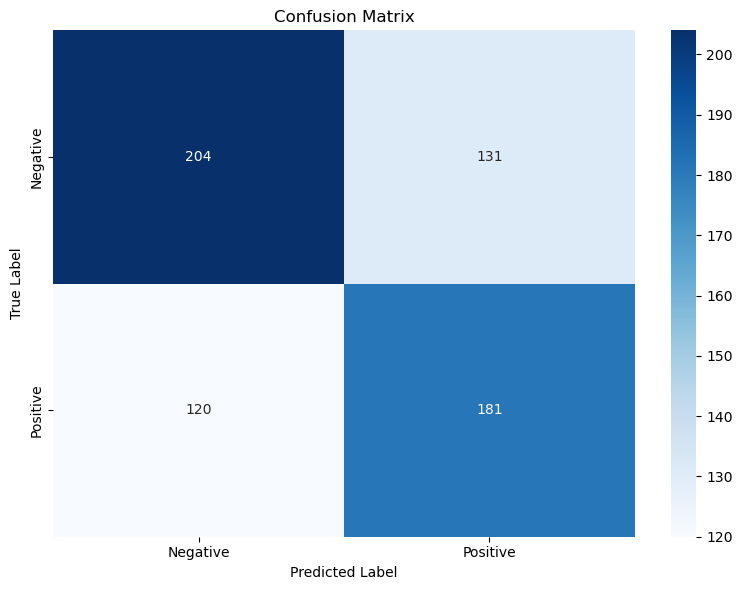

ROC AUC Score: 0.6051


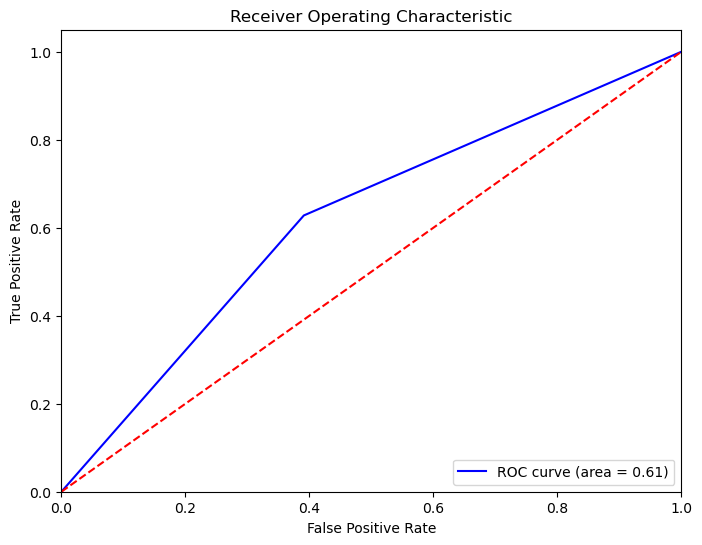

In [31]:
ncc = NCC()
ncc.fit(X_train_pca, y_train)
y_pred_lr = ncc.predict(X_test_pca)

print("Classification Report:")
print(classification_report(y_test, y_pred_lr))

conf_matrix_ncc = confusion_matrix(y_test, y_pred_lr)
conf_matrix = confusion_matrix(y_test, y_pred_lr)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC for NCC:
roc_auc_score_value = roc_auc_score(y_test, y_pred_lr)
print(f"ROC AUC Score: {roc_auc_score_value:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_lda)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc_score_value)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


Regularized LDA (R-LDA) Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.61      0.64       335
           1       0.61      0.68      0.64       301

    accuracy                           0.64       636
   macro avg       0.64      0.64      0.64       636
weighted avg       0.65      0.64      0.64       636



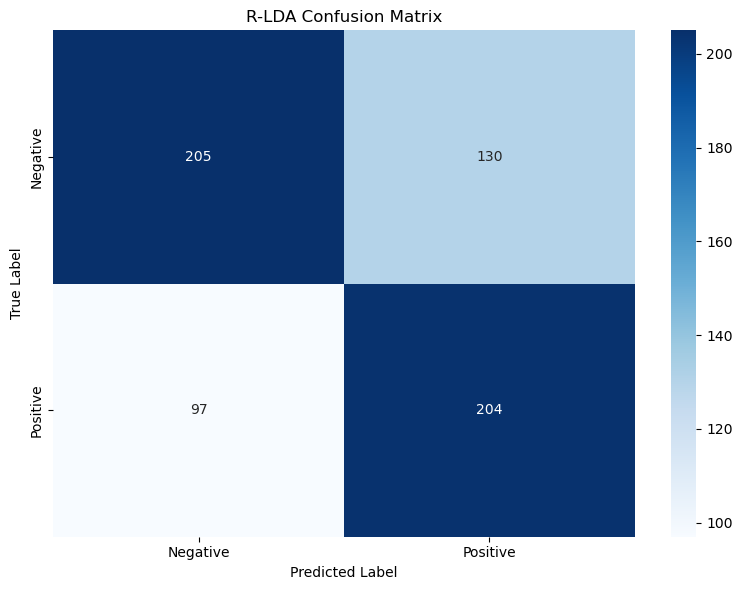

R-LDA ROC AUC Score: 0.6448


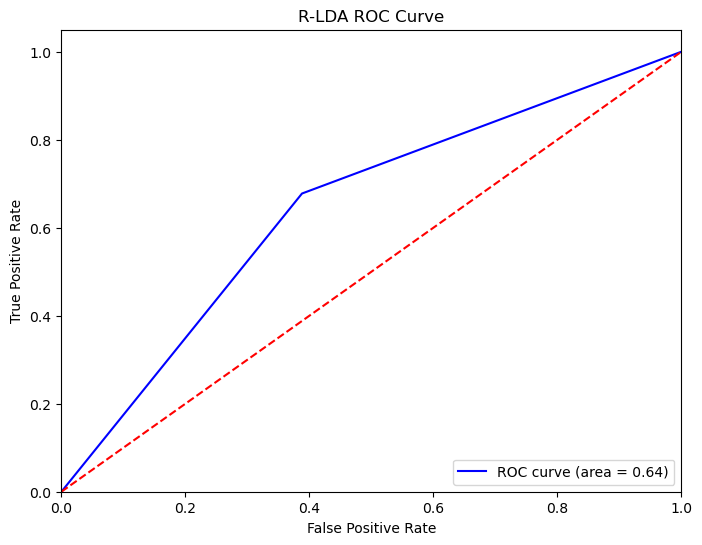

In [32]:
# Create and train LDA with shrinkage (real R-LDA)
rlda = LDA(solver='lsqr', shrinkage=0.5)  # 'auto' lets sklearn choose optimal shrinkage via Ledoit-Wolf
rlda.fit(X_train_pca, y_train)

# Predict
y_pred_rlda = rlda.predict(X_test_pca)

# Classification report
print("Regularized LDA (R-LDA) Classification Report:")
print(classification_report(y_test, y_pred_rlda))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rlda)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('R-LDA Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC Score
roc_auc = roc_auc_score(y_test, y_pred_rlda)
print(f"R-LDA ROC AUC Score: {roc_auc:.4f}")

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_rlda)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('R-LDA ROC Curve')
plt.legend(loc='lower right')
plt.show()


Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.61      0.62       335
           1       0.58      0.60      0.59       301

    accuracy                           0.60       636
   macro avg       0.60      0.60      0.60       636
weighted avg       0.60      0.60      0.60       636



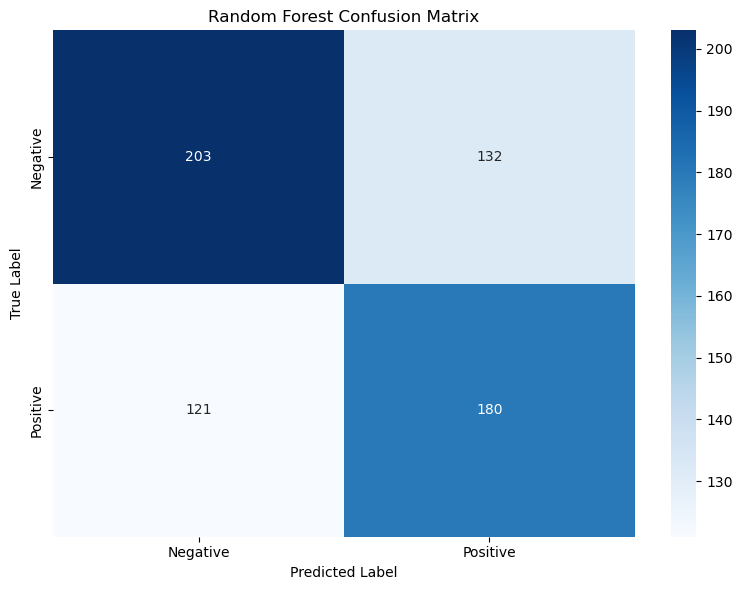

Random Forest ROC AUC Score: 0.6020


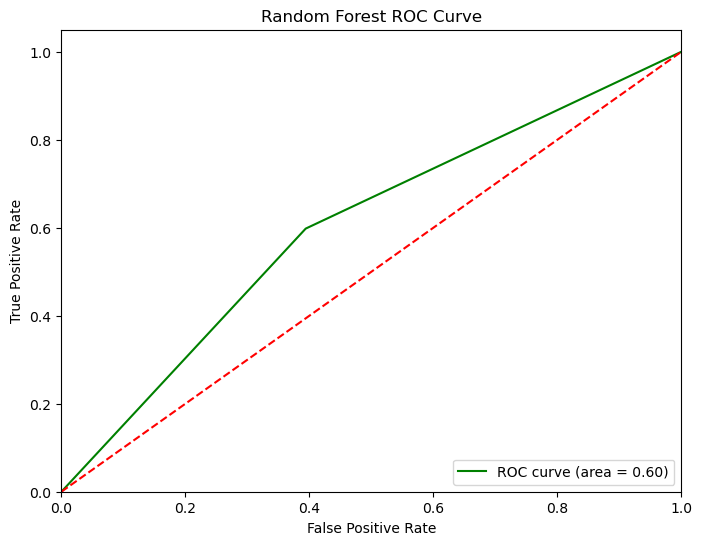

In [33]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_pca, y_train)

# Predict
y_pred_rf = rf.predict(X_test_pca)

# Classification Report
print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Confusion Matrix
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Random Forest Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC Score
roc_auc_rf = roc_auc_score(y_test, y_pred_rf)
print(f"Random Forest ROC AUC Score: {roc_auc_rf:.4f}")

# ROC Curve
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
plt.plot(fpr_rf, tpr_rf, color='green', label='ROC curve (area = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC Curve')
plt.legend(loc='lower right')
plt.show()

Epoch 1/10
80/80 [==============================] - 7s 42ms/step - loss: 0.6966 - accuracy: 0.5527 - val_loss: 0.6630 - val_accuracy: 0.5833
Epoch 2/10
80/80 [==============================] - 2s 27ms/step - loss: 0.5877 - accuracy: 0.6906 - val_loss: 0.6698 - val_accuracy: 0.5943
Epoch 3/10
80/80 [==============================] - 2s 27ms/step - loss: 0.5576 - accuracy: 0.7288 - val_loss: 0.6850 - val_accuracy: 0.5833
Epoch 4/10
80/80 [==============================] - 2s 26ms/step - loss: 0.5199 - accuracy: 0.7590 - val_loss: 0.6843 - val_accuracy: 0.5865
Epoch 5/10
80/80 [==============================] - 2s 23ms/step - loss: 0.4886 - accuracy: 0.7803 - val_loss: 0.6913 - val_accuracy: 0.5912
Epoch 6/10
80/80 [==============================] - 2s 22ms/step - loss: 0.4685 - accuracy: 0.7995 - val_loss: 0.6987 - val_accuracy: 0.5912
Epoch 7/10
80/80 [==============================] - 2s 25ms/step - loss: 0.4454 - accuracy: 0.8113 - val_loss: 0.7221 - val_accuracy: 0.5739
Epoch 8/10
80

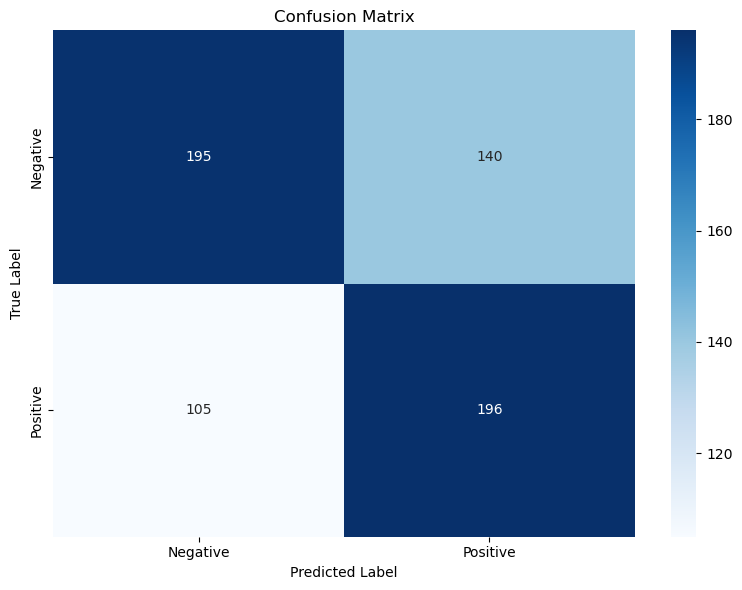

ROC AUC Score: 0.6166


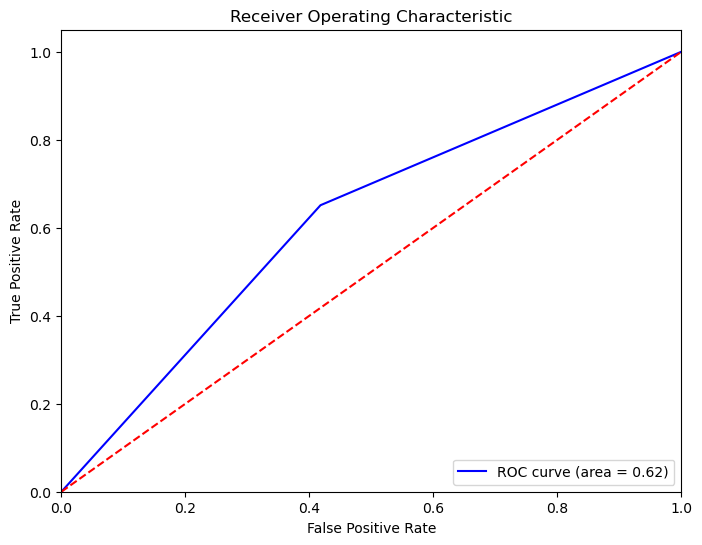

In [34]:
# Assuming X_train and X_test are the raw time-series data
# Reshape to 3D: [samples, time_steps, features]
time_steps = 10  # Adjust according to your sequence length
X_train_reshaped = X_train.reshape(X_train.shape[0], time_steps, X_train.shape[1] // time_steps)
X_test_reshaped = X_test.reshape(X_test.shape[0], time_steps, X_test.shape[1] // time_steps)

# Create LSTM model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Create LSTM model
model = Sequential()
model.add(LSTM(64, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]), return_sequences=False))
model.add(Dense(1, activation='sigmoid'))  # For binary classification (adjust for multi-class)

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32, validation_data=(X_test_reshaped, y_test))

# Make predictions
y_pred = model.predict(X_test_reshaped)
y_pred = (y_pred > 0.5).astype(int)  # Convert to binary class (0 or 1)

# Print classification report
print("LSTM Classification Report:")
print(classification_report(y_test, y_pred))

# Create confusion matrix display
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# ROC AUC for LSTM
roc_auc_score_value = roc_auc_score(y_test, y_pred)
print(f"ROC AUC Score: {roc_auc_score_value:.4f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc_score_value)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()